# Projet P7 - Implémentez un modèle de scoring
*OPENCLASSROOMS - Parcours Data Scientist - Adeline Le Ray - 10/2024*
<hr>

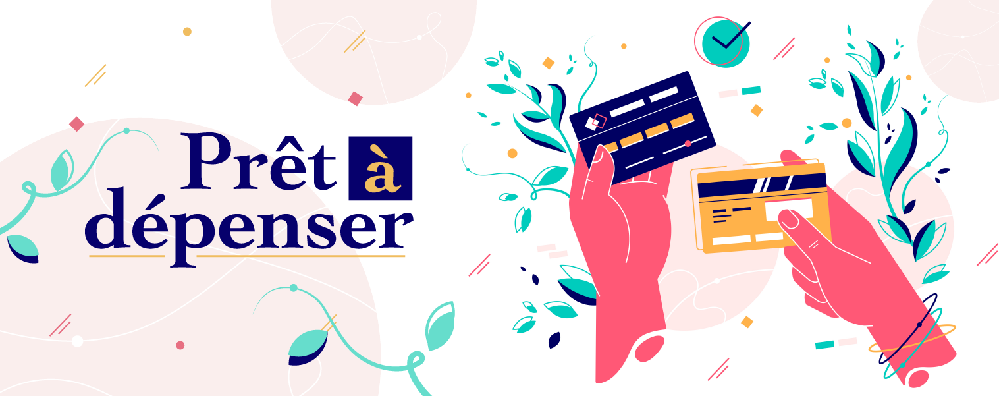

La société financière, **"Prêt à dépenser"**, propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt. "Prêt à dépenser" souhaite mettre en œuvre un **outil de “scoring crédit”** pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.)

**La mission :**
* Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
* Analyser les features qui contribuent le plus au modèle, d’une manière générale (feature importance globale) et au niveau d’un client (feature importance locale), afin, dans un soucis de transparence, de permettre à un chargé d’études de mieux comprendre le score attribué par le modèle.
* Mettre en production le modèle de scoring de prédiction à l’aide d’une API et réaliser une interface de test de cette API.
* Mettre en œuvre une approche globale MLOps de bout en bout, du tracking des expérimentations à l’analyse en production du data drift.


[Exemples d'utilisation de MLflow](https://github.com/mlflow/mlflow/tree/master/examples)

# Import libraries

In [1]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

import mlflow

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Models
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

import os
import joblib
import pickle

import json

import shap

In [2]:
import LeRay_Adeline_2_4_modelisation_functions_102024 as func

In [3]:
# # Reload func without restarting kernel
# import importlib
# importlib.reload(func)

<module 'LeRay_Adeline_2_4_modelisation_functions_102024' from 'C:\\Users\\Adeline\\Documents\\5-OpenClassrooms\\Parcours DS\\P7\\modelisation\\LeRay_Adeline_2_4_modelisation_functions_102024.py'>

In [4]:
# Version python
!python --version

# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

Python 3.11.4numpy - 1.24.4
pandas - 2.2.2
seaborn - 0.13.2
json - 2.0.9
shap - 0.44.1



In [5]:
# Initialisation de shap 
shap.initjs()

In [6]:
# Paramètres par défauts des graphiques
sns.set_style('whitegrid')        # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=13)     # fontsize of the axes title
plt.rc('axes', labelsize=13)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=11)    # fontsize of the tick labels
plt.rc('ytick', labelsize=11)    # fontsize of the tick labels
plt.rc('legend', fontsize=11)    # legend fontsize
plt.rc('font', size=11)          # controls default text sizes
width = 7
height = 5
plt.figure(figsize=(width, height));

<Figure size 700x500 with 0 Axes>

# Import data and start experiment

## Import data

In [7]:
final_df = pd.read_pickle('df_final.pkl')

In [8]:
train_df = final_df[final_df['TARGET'].notnull()]
test_df = final_df[final_df['TARGET'].isnull()]

In [9]:
# Define features (X) and target (y)
X = train_df.drop(columns=['TARGET'])
y = train_df['TARGET']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Start experiment

[Experiment-tracking-and-model-registry-with-mlflow](https://medium.com/@johnthuo/experiment-tracking-and-model-registry-with-mlflow-a74c30217e8c)

In [12]:
# Set MLFlow
experiment_name = 'OC_DS_P7_Scoring'
func.setup_mlflow(experiment_name)

Launching MLflow UI at sqlite:///mlflow.db...
Experiment 'OC_DS_P7_Scoring' already exists.
Using experiment 'OC_DS_P7_Scoring'.


In [11]:
seed = 42

# Model selection

Expériences avec :
* Jeu de données déséquilibré
* Utilisation de SMOTE pour équilibrer les classes
* Utilisation de l'argument `class_weight = 'balanced'`

Différents modèles sont testés, ainsi que différentes métriques à optimiser par GridSearch CV.

Tous les runs des expériences sont suivis dans Mlflow.

## With unbalanced dataset

Utilisation de LightGBM avec le paramètre boosting_type = 'rf' à la place de Random Forest -> plus rapide

*Source : [Kaggle - Example of use of LightGBM Random Forest](https://www.kaggle.com/code/ogrellier/feature-selection-with-null-importances)*

In [18]:
models = {
    # Dummy Classifier
    'Dummy Classifier': (DummyClassifier(), {
        'classification__strategy': ['prior', 'most_frequent']
    }),

    # Logistic Regression
    'Logistic Regression': (LogisticRegression(random_state=seed), {
        'classification__C': np.logspace(1, 5, 5)
    }),

    # LightGBM RF Classifier
    'Lgb Random Forest Classifier': (LGBMClassifier(objective='binary', 
                                              boosting_type='rf', 
                                              bagging_freq=1,
                                              subsample=0.6,
                                              colsample_bytree=0.7,
                                              random_state=seed), {
        'classification__n_estimators': [100, 200, 500]
    }),

    # LightGBM Classifier
    'LightGBM Classifier': (LGBMClassifier(objective='binary', random_state=seed), {
        'classification__n_estimators': [100, 200, 500]
    })
}


Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'none', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'roc_auc', 'beta': 2}
Parent Run: model_selection_roc_auc_2_grid_none_None
Running Dummy Classifier...


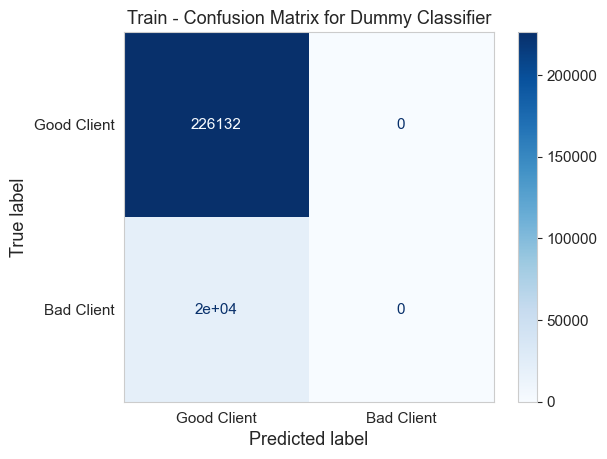

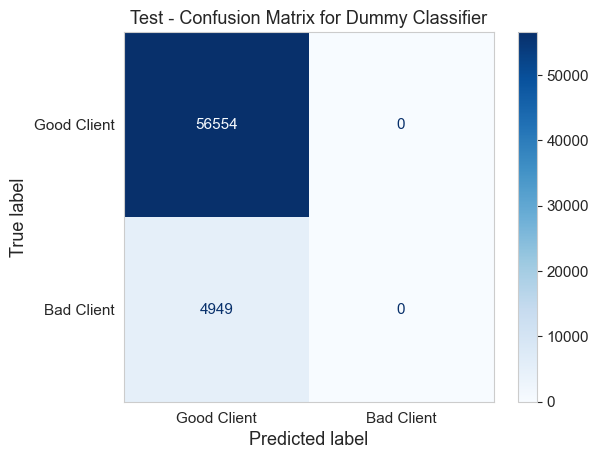

Best Dummy Classifier model saved in MLflow with roc_auc: 0.500
Running Logistic Regression...


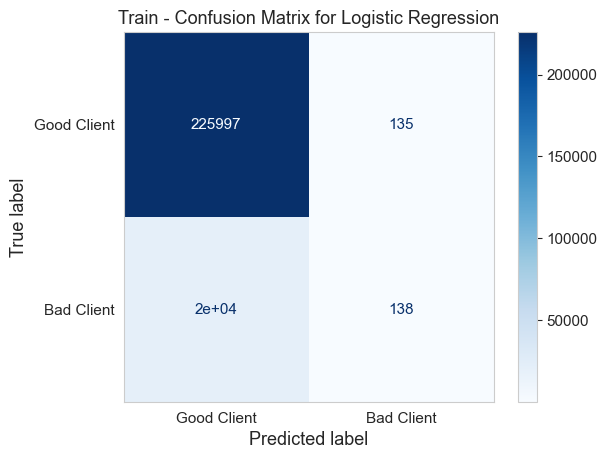

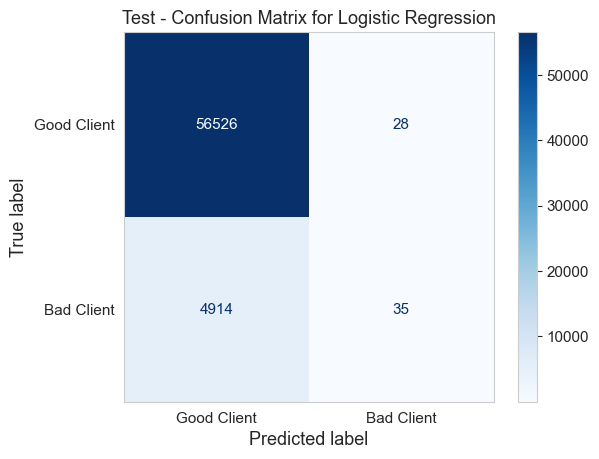

Best Logistic Regression model saved in MLflow with roc_auc: 0.735
Running Lgb Random Forest Classifier...
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ign

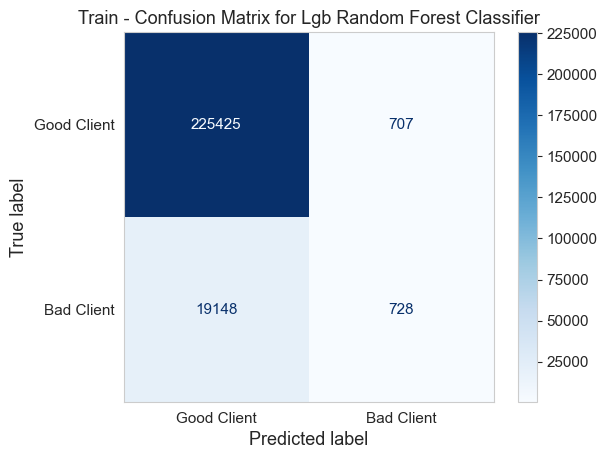

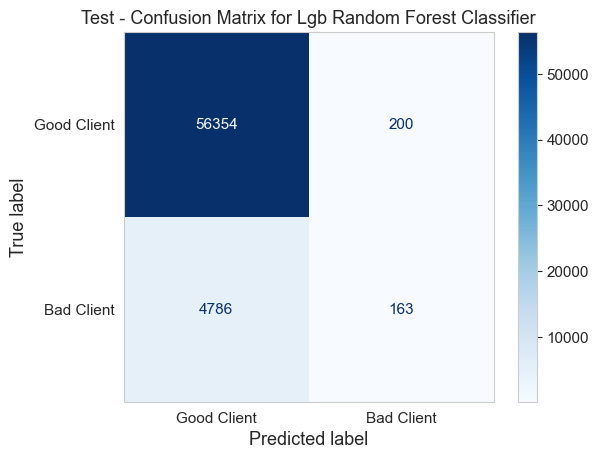

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Best Lgb Random Forest Classifier model saved in MLflow with roc_auc: 0.733
Running LightGBM Classifier...
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606


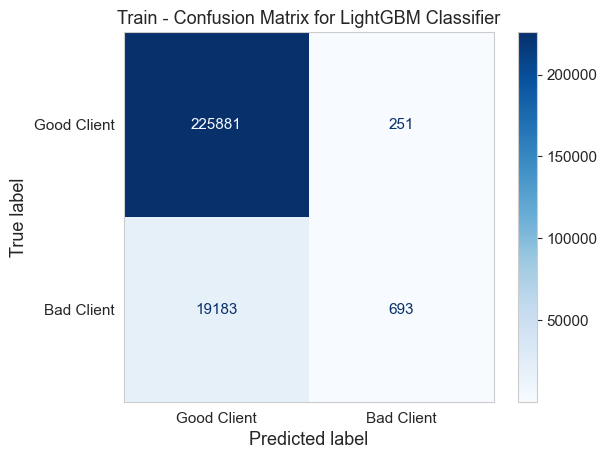

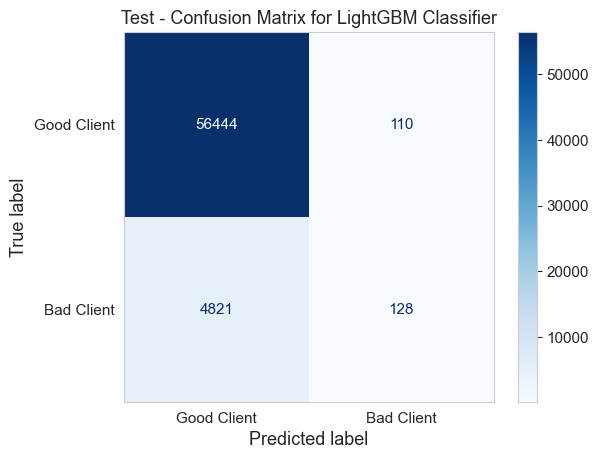

Best LightGBM Classifier model saved in MLflow with roc_auc: 0.764
All models have been tuned and logged in MLflow.


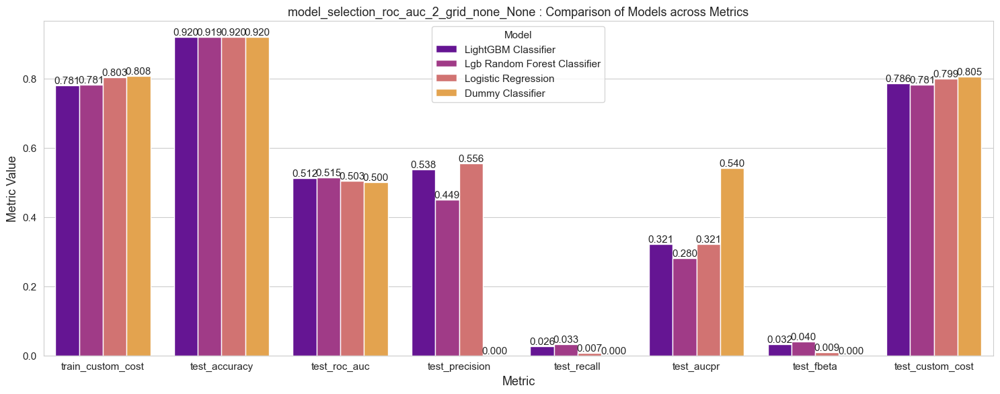

Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'none', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'custom_cost', 'beta': 2}
Parent Run: model_selection_custom_cost_2_grid_none_None
Running Dummy Classifier...


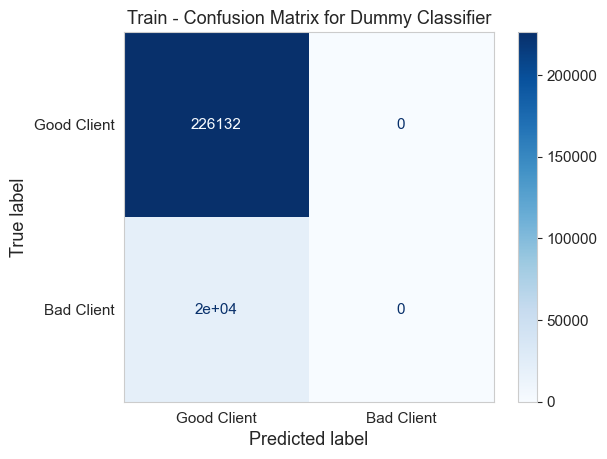

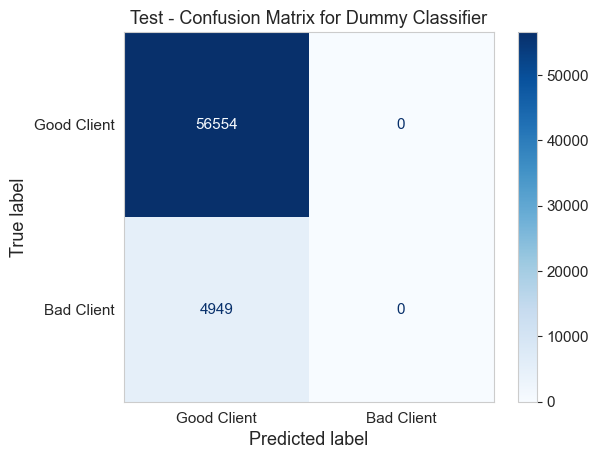

Best Dummy Classifier model saved in MLflow with custom_cost: -0.808
Running Logistic Regression...


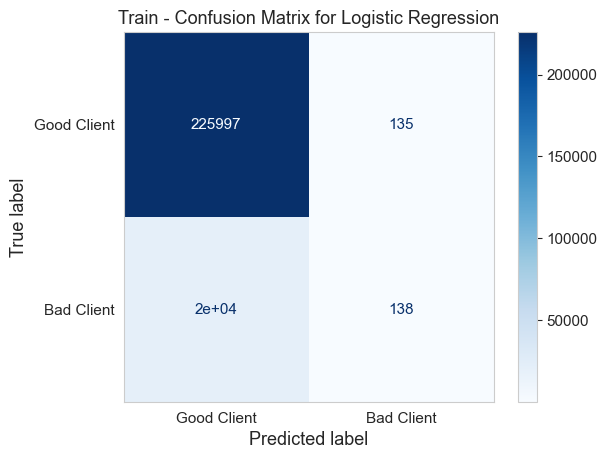

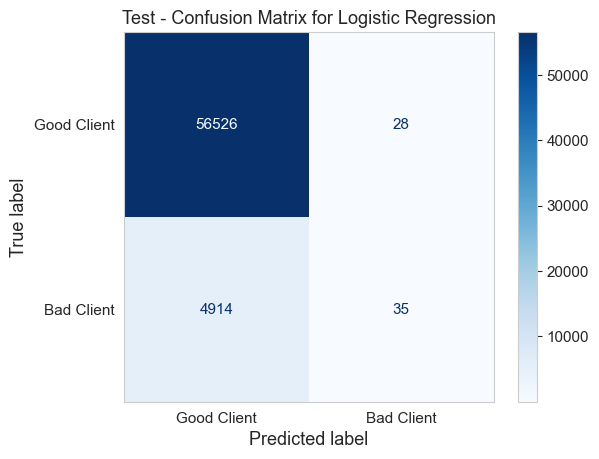

Best Logistic Regression model saved in MLflow with custom_cost: -0.803
Running Lgb Random Forest Classifier...
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will b

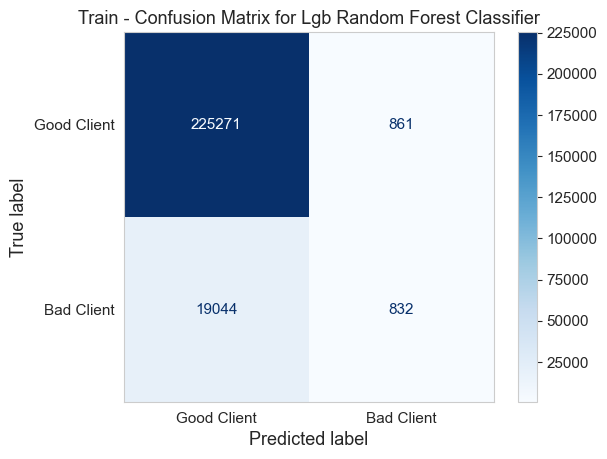

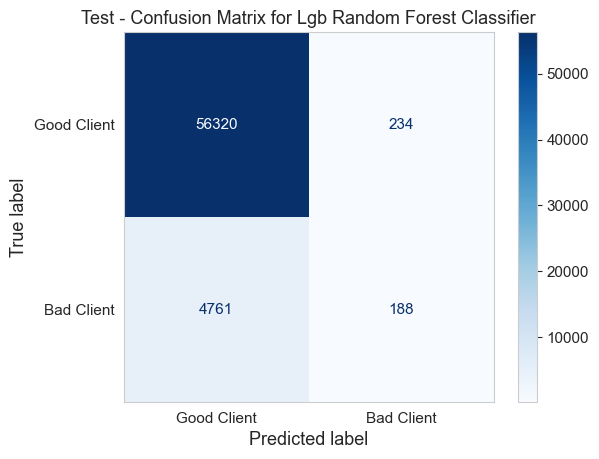

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Best Lgb Random Forest Classifier model saved in MLflow with custom_cost: -0.782
Running LightGBM Classifier...
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606


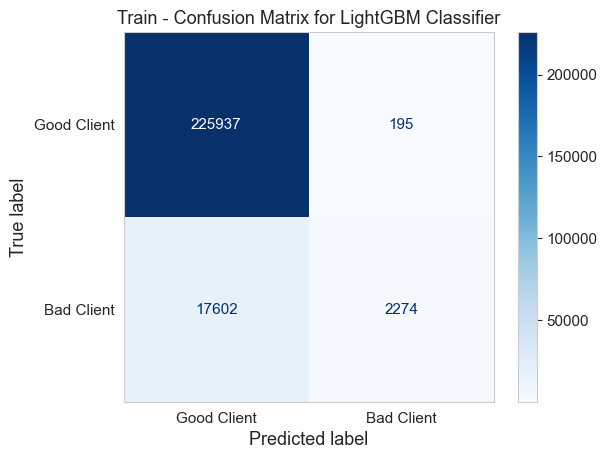

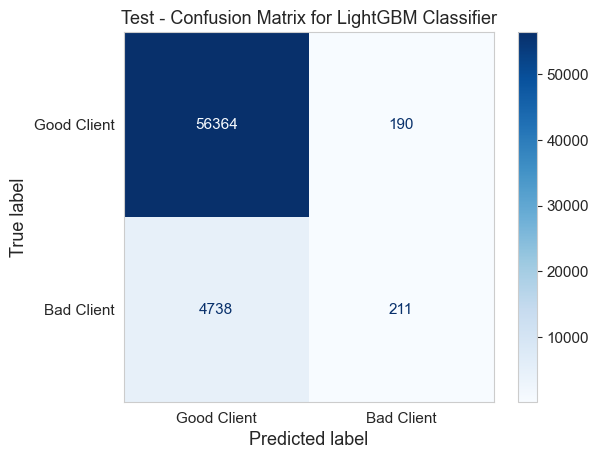

Best LightGBM Classifier model saved in MLflow with custom_cost: -0.782
All models have been tuned and logged in MLflow.


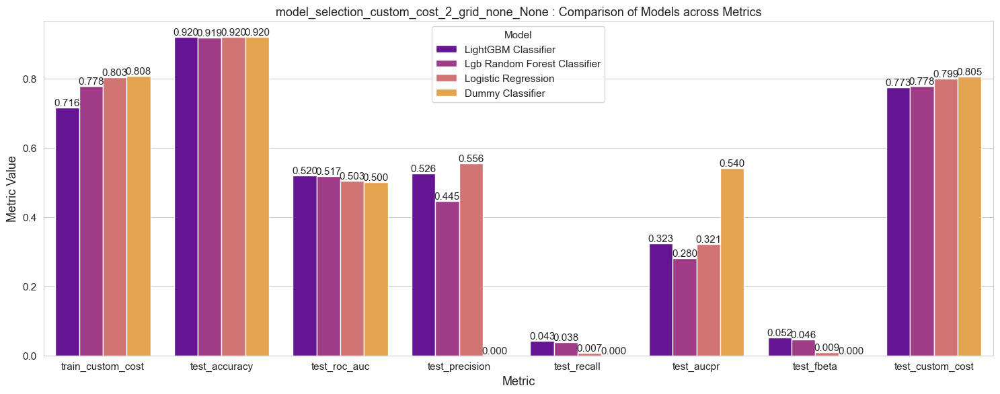

Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'none', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'fbeta', 'beta': 2}
Parent Run: model_selection_fbeta_2_grid_none_None
Running Dummy Classifier...


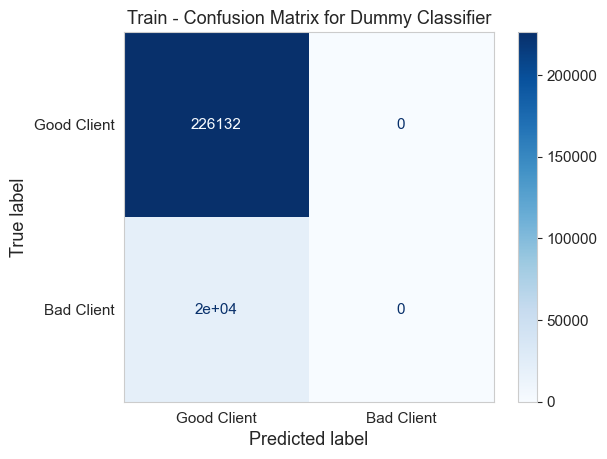

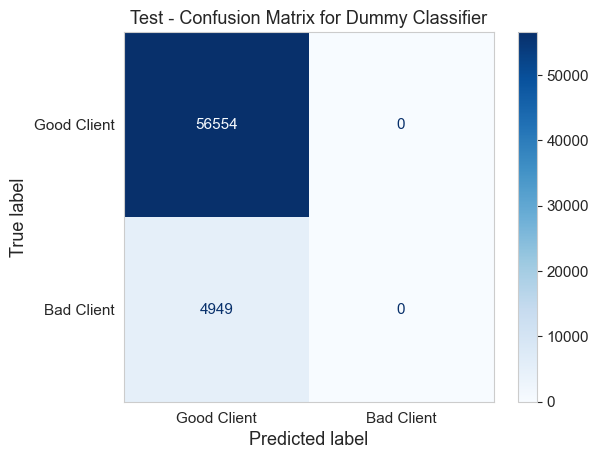

Best Dummy Classifier model saved in MLflow with fbeta: 0.000
Running Logistic Regression...


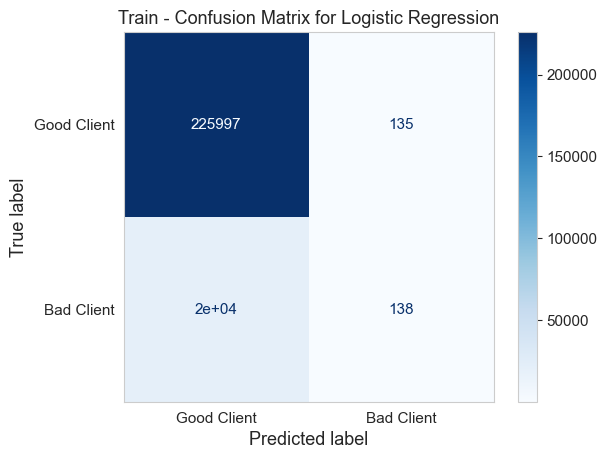

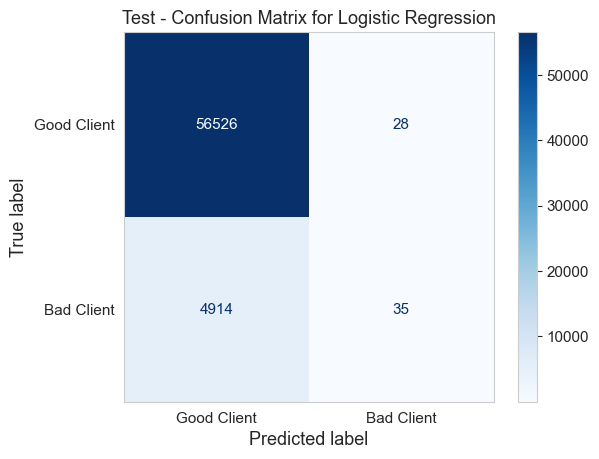

Best Logistic Regression model saved in MLflow with fbeta: 0.008
Running Lgb Random Forest Classifier...
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignor

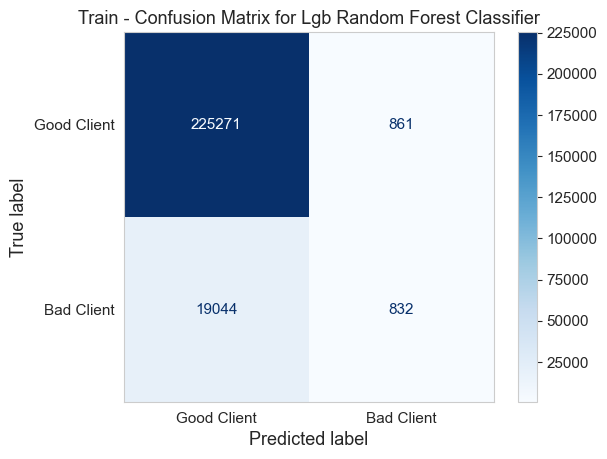

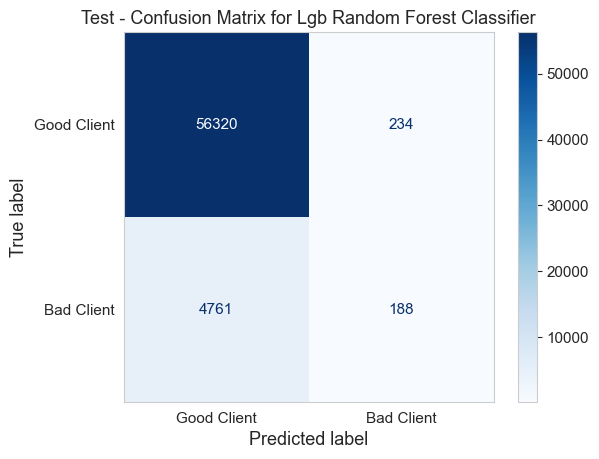

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Best Lgb Random Forest Classifier model saved in MLflow with fbeta: 0.046
Running LightGBM Classifier...
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606


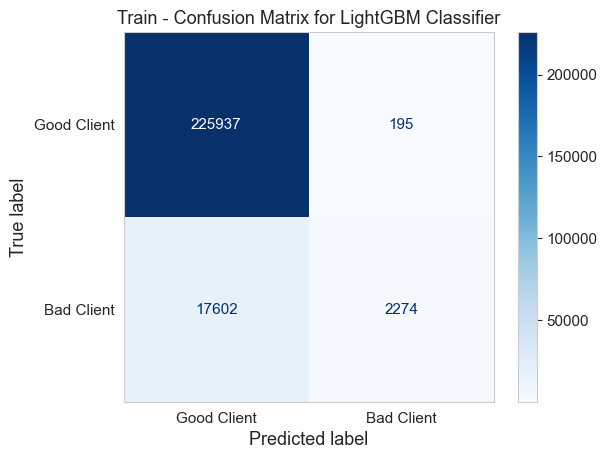

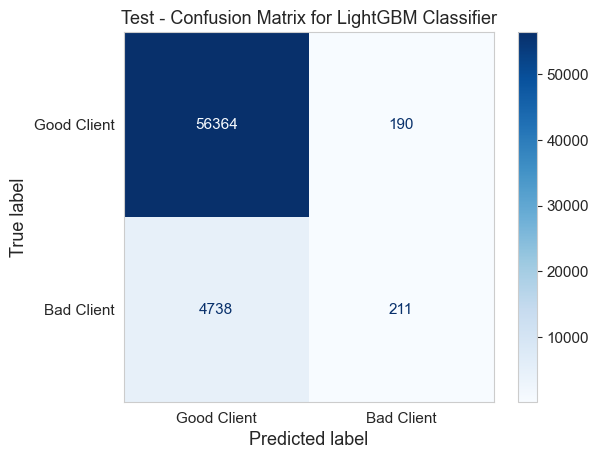

Best LightGBM Classifier model saved in MLflow with fbeta: 0.044
All models have been tuned and logged in MLflow.


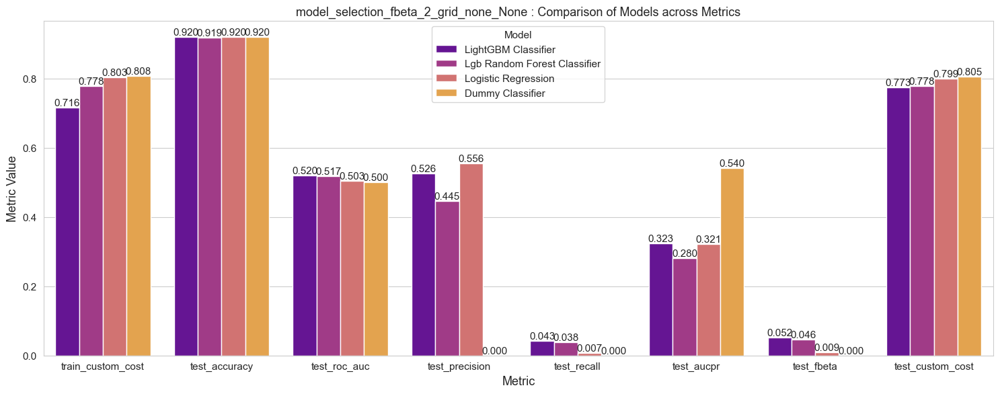

Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'none', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'fbeta', 'beta': 3}
Parent Run: model_selection_fbeta_3_grid_none_None
Running Dummy Classifier...


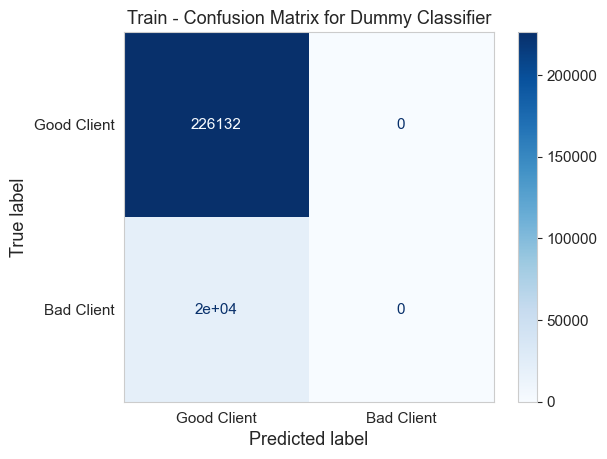

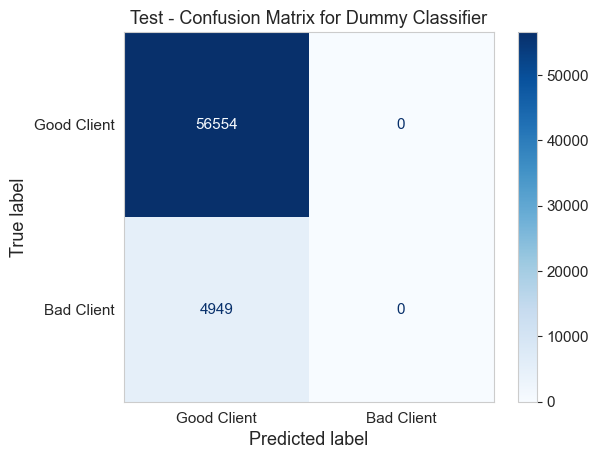

Best Dummy Classifier model saved in MLflow with fbeta: 0.000
Running Logistic Regression...


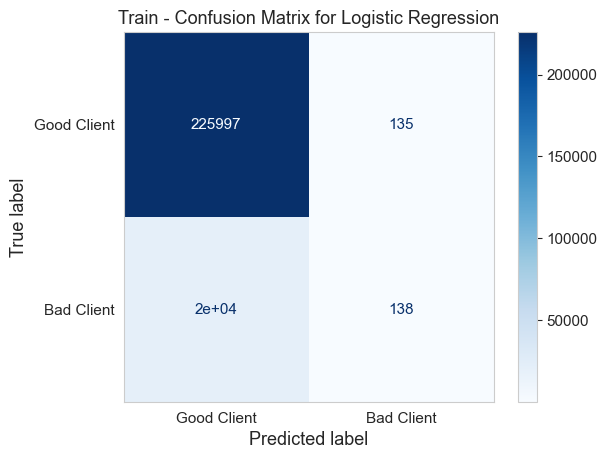

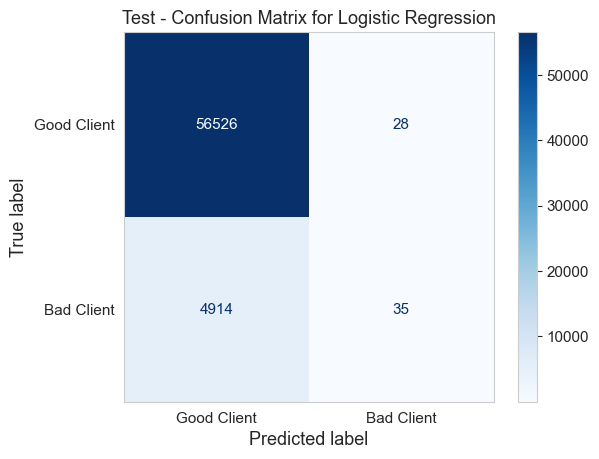

Best Logistic Regression model saved in MLflow with fbeta: 0.007
Running Lgb Random Forest Classifier...
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignor

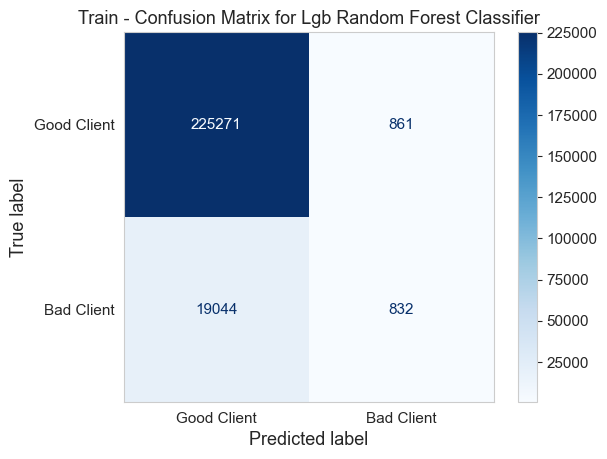

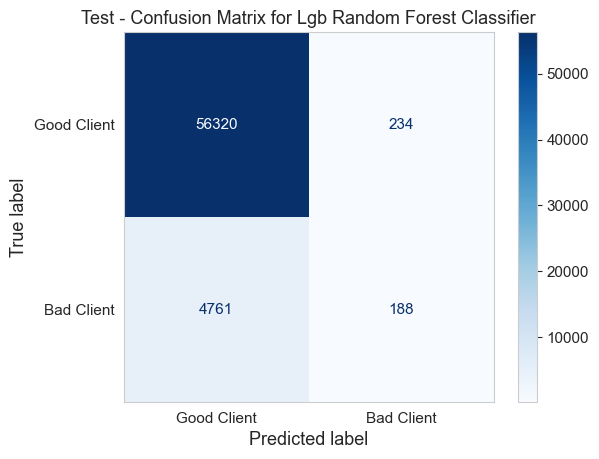

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Best Lgb Random Forest Classifier model saved in MLflow with fbeta: 0.041
Running LightGBM Classifier...
[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12091
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080794 -> initscore=-2.431606
[LightGBM] [Info] Start training from score -2.431606


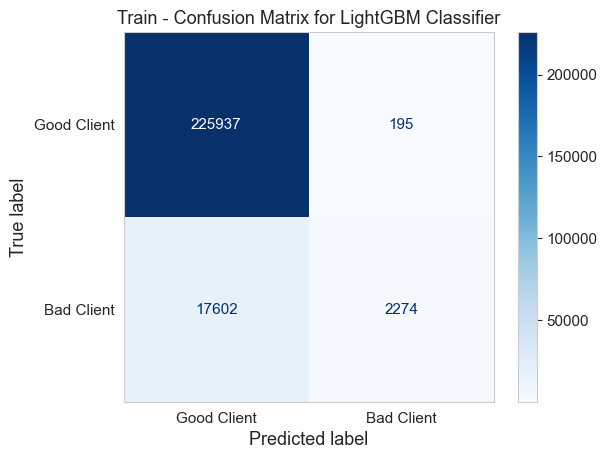

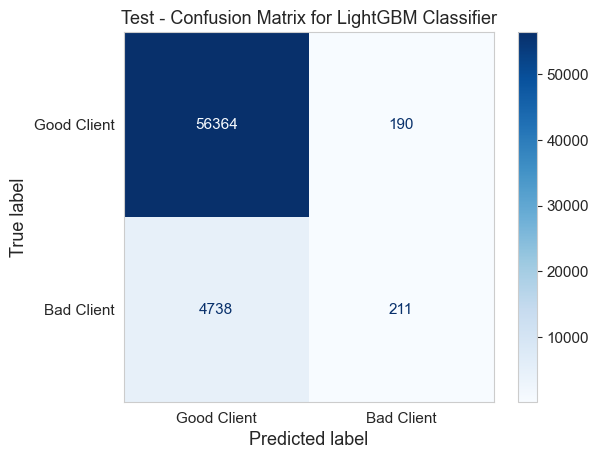

Best LightGBM Classifier model saved in MLflow with fbeta: 0.040
All models have been tuned and logged in MLflow.


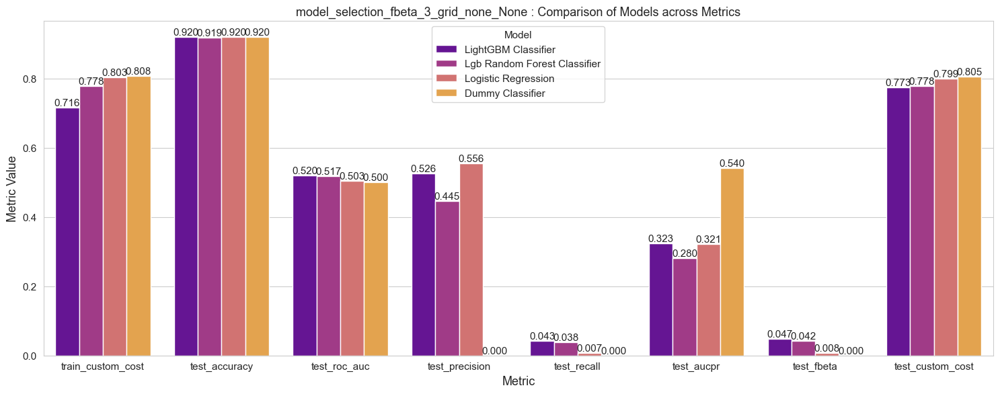

In [19]:
# List of scoring metrics to test
scoring_metrics = [
    {'metric': 'roc_auc', 'beta': 2},  
    {'metric': 'custom_cost', 'beta': 2}, 
    {'metric': 'fbeta', 'beta': 2},  
    {'metric': 'fbeta', 'beta': 3}  
]

# Base parameters
run_params_base_1 = {
    'run_type': 'model_selection',
    'search_type': 'grid',
    'sampling_method': 'none',
    'sampling_strategy': None,
    'fp_weight': 1,
    'fn_weight': 10,
    'register' : False,
    'optim_threshold' : False
}

# Loop over scoring metrics and update run parameters
for scoring in scoring_metrics:
    run_params = run_params_base_1.copy()  
    run_params['scoring_metric'] = scoring['metric']
    run_params['beta'] = scoring['beta']  
    
    # Print or use run_params for model training
    print("Running with parameters:", run_params)
    func.run_experiment(models, X_train, y_train, X_test, y_test, run_params)
    
    # Plot results
    parent_run_name = f"{run_params['run_type']}_{run_params['scoring_metric']}_{run_params['beta']}_{run_params['search_type']}_{run_params['sampling_method']}_{run_params['sampling_strategy']}"

    func.plot_model_comparisons(experiment_name, parent_run_name)

## SMOTE - Synthetic Minority Over-sampling Technique - sampling_strategy = 'not majority'

SMOTE (Synthetic Minority Over-sampling Technique) est une méthode de sur-échantillonnage utilisée pour équilibrer des ensembles de données où une classe est sous-représentée. Elle fonctionne en créant de nouveaux exemples synthétiques à partir des voisins les plus proches d'une observation existante de la classe minoritaire. Ces nouveaux exemples sont générés en interpolant entre les caractéristiques des instances minoritaires, ce qui aide à augmenter la diversité sans dupliquer simplement les données existantes.

In [22]:
# Check how SMOTE works with sampling_strategy = 'not majority'
from collections import Counter

# Impute
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Scale data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)

# SMOTE with 'not majority' sampling
smote = SMOTE(sampling_strategy='not majority', random_state=42)
X_res, y_res = smote.fit_resample(X_train_scaled, y_train)

# Class repartition after SMOTE
print("Répartition des classes après SMOTE : ", Counter(y_res))

# Sampling size before and after SMOTE
print(f"Taille de l'échantillon original : {X_train.shape[0]}")
print(f"Taille de l'échantillon après SMOTE : {X_res.shape[0]}")


Répartition des classes après SMOTE :  Counter({0.0: 226132, 1.0: 226132})
Taille de l'échantillon original : 246008
Taille de l'échantillon après SMOTE : 452264


In [23]:
models = {
    # Dummy Classifier
    'Dummy Classifier': (DummyClassifier(), {
        'classification__strategy': ['prior', 'most_frequent']
    }),

    # Logistic Regression
    'Logistic Regression': (LogisticRegression(random_state=seed), {
        'classification__C': np.logspace(1, 5, 5)
    }),

    # LightGBM RF Classifier
    'Lgb Random Forest Classifier': (LGBMClassifier(objective='binary', 
                                              boosting_type='rf', 
                                              bagging_freq=1,
                                              subsample=0.6,
                                              colsample_bytree=0.7,
                                              random_state=seed), {
        'classification__n_estimators': [100, 200, 500]
    }),
    
    # LightGBM Classifier
    'LightGBM Classifier': (LGBMClassifier(objective='binary', random_state=seed, verbosity=-1), {
        'classification__n_estimators': [100, 200, 500]
    })
}


Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'smote', 'sampling_strategy': 'not majority', 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'roc_auc', 'beta': 2}
Parent Run: model_selection_roc_auc_2_grid_smote_not majority
Running Dummy Classifier...


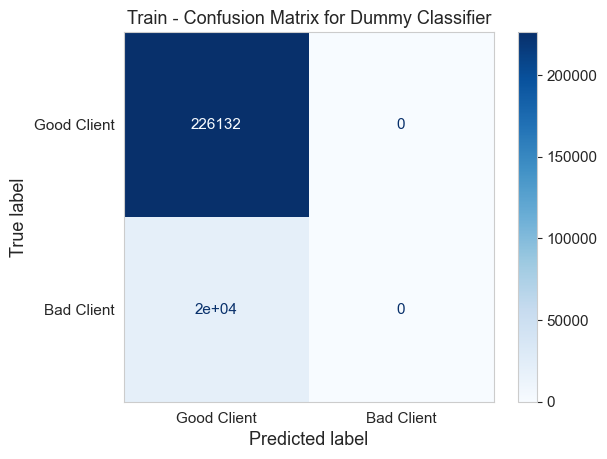

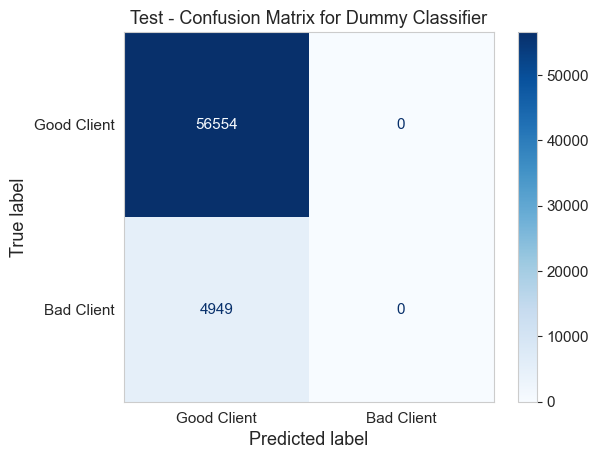

Best Dummy Classifier model saved in MLflow with roc_auc: 0.500
Running Logistic Regression...


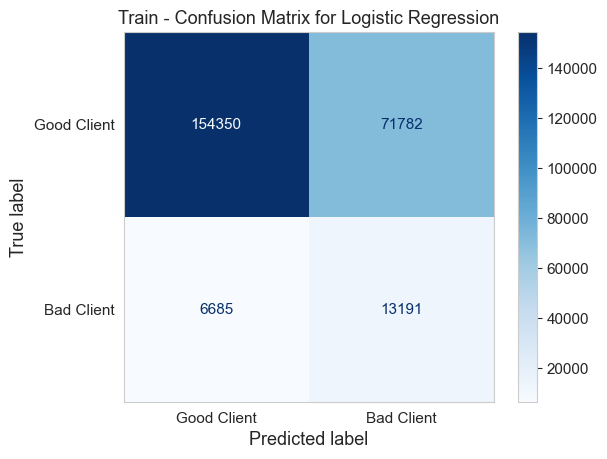

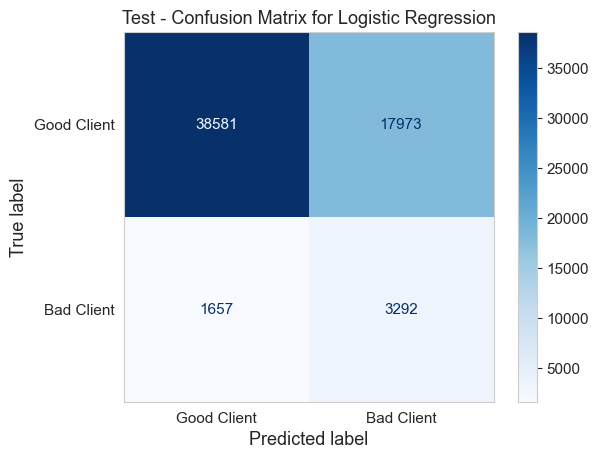

Best Logistic Regression model saved in MLflow with roc_auc: 0.732
Running Lgb Random Forest Classifier...
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 226132, number of negative: 226132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12750
[LightGBM] [Info] Number of data points in the train set: 452264, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


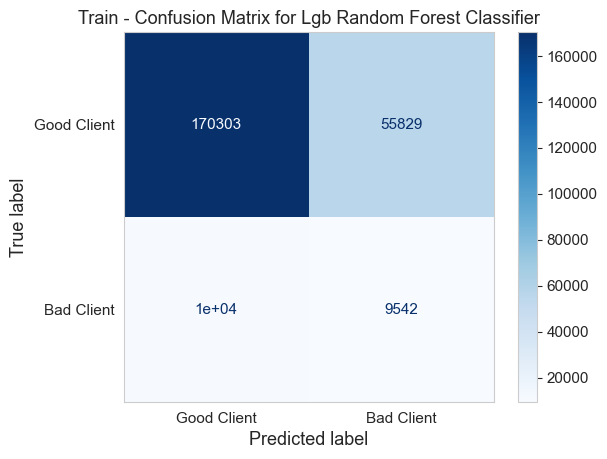

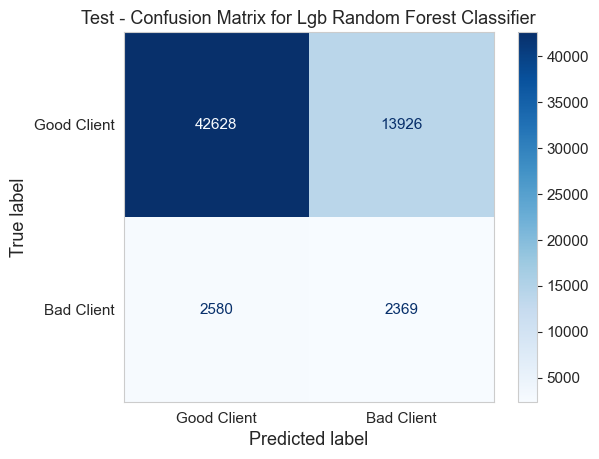

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
Best Lgb Random Forest Classifier model saved in MLflow with roc_auc: 0.678
Running LightGBM Classifier...


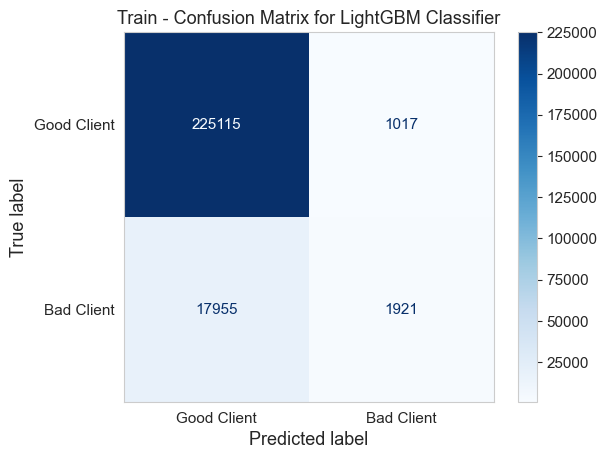

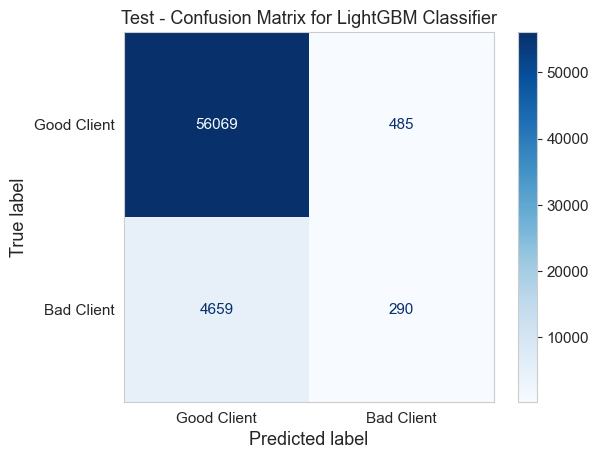

Best LightGBM Classifier model saved in MLflow with roc_auc: 0.739
All models have been tuned and logged in MLflow.


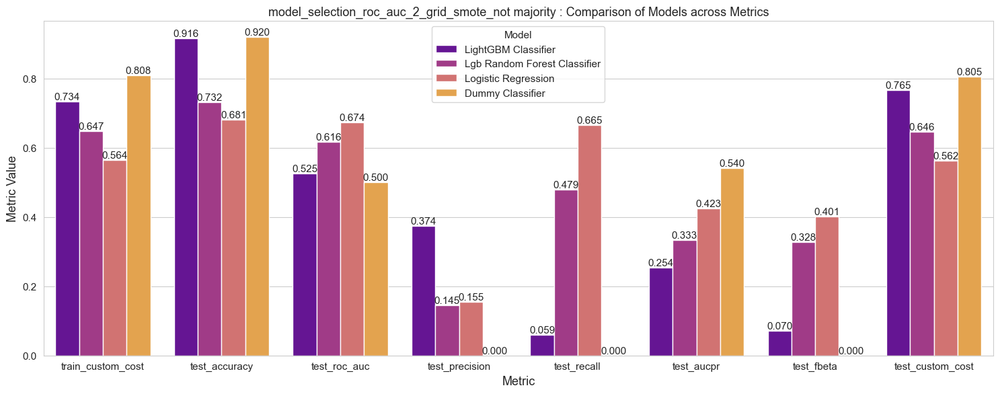

Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'smote', 'sampling_strategy': 'not majority', 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'custom_cost', 'beta': 2}
Parent Run: model_selection_custom_cost_2_grid_smote_not majority
Running Dummy Classifier...


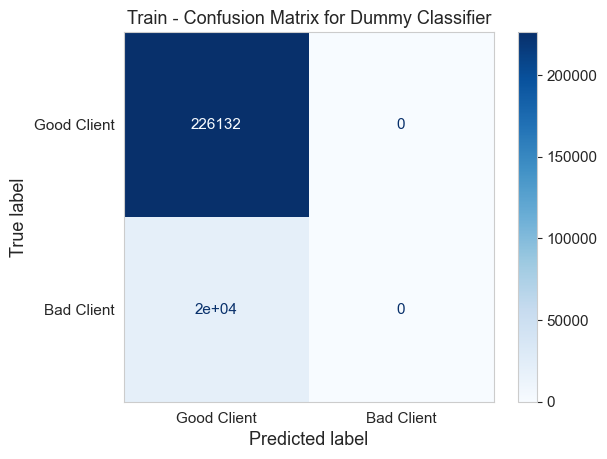

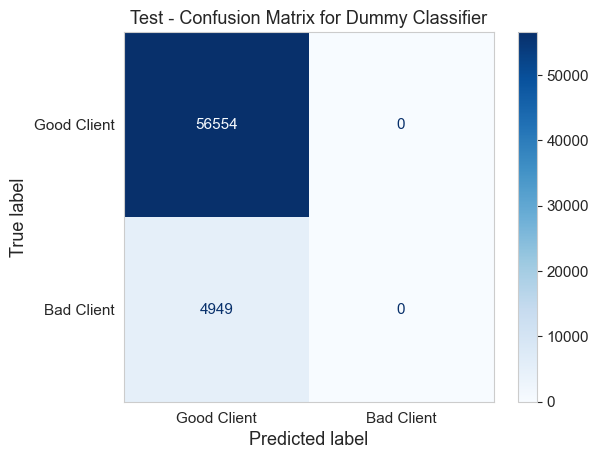

Best Dummy Classifier model saved in MLflow with custom_cost: -0.808
Running Logistic Regression...


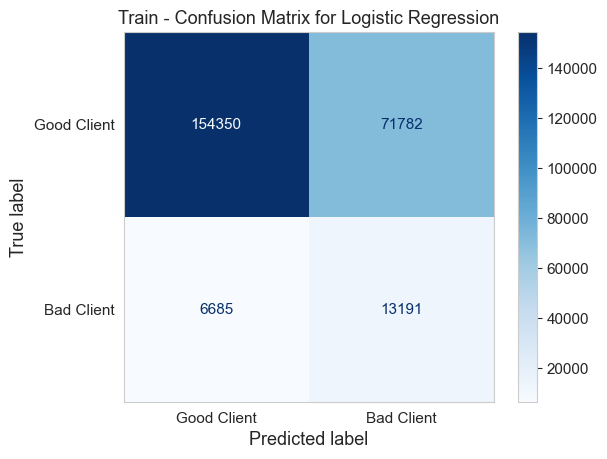

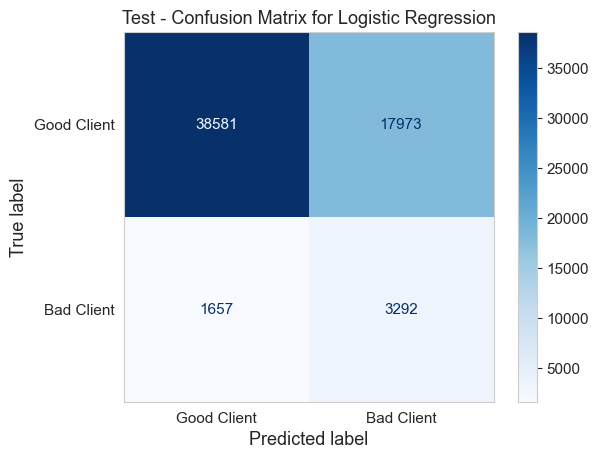

Best Logistic Regression model saved in MLflow with custom_cost: -0.565
Running Lgb Random Forest Classifier...


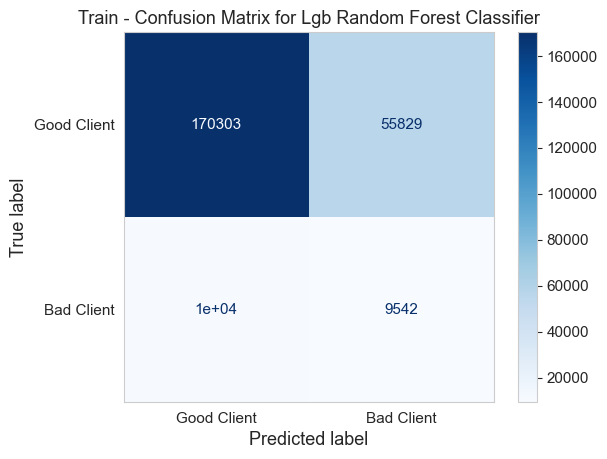

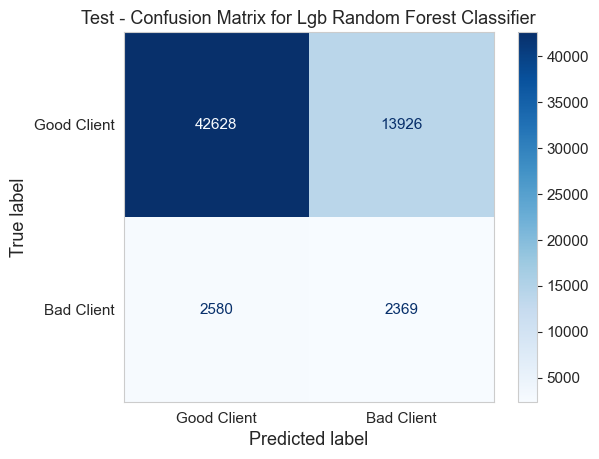

Best Lgb Random Forest Classifier model saved in MLflow with custom_cost: -0.651
Running LightGBM Classifier...


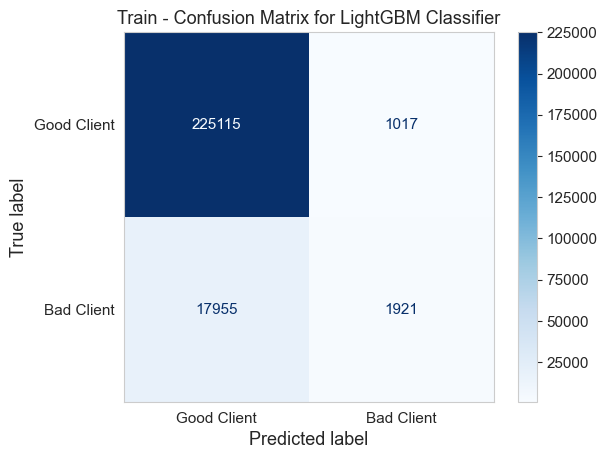

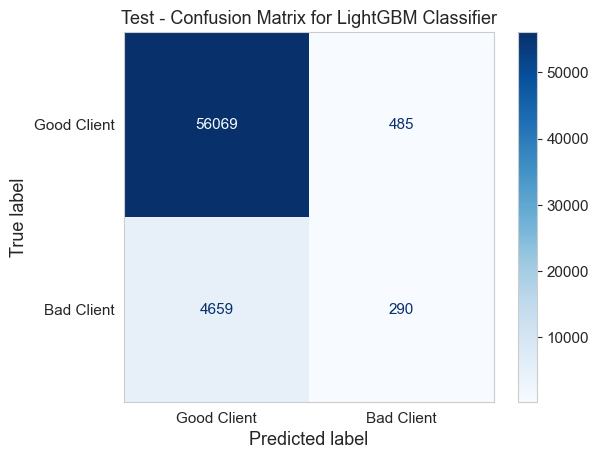

Best LightGBM Classifier model saved in MLflow with custom_cost: -0.770
All models have been tuned and logged in MLflow.


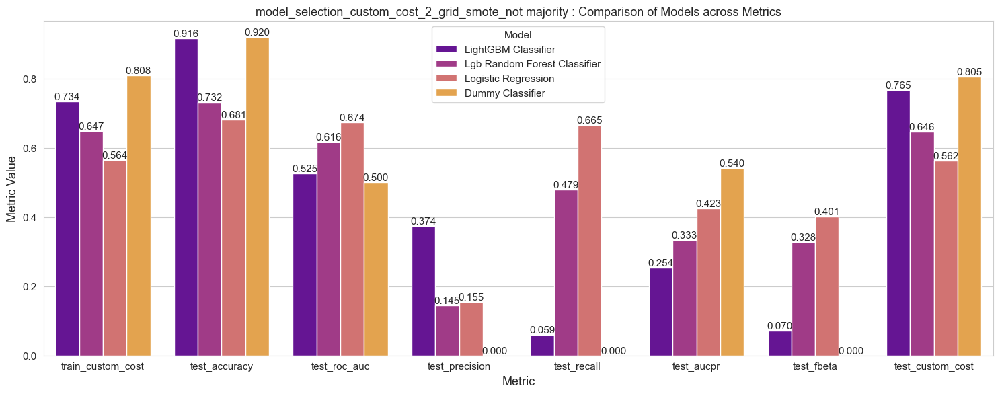

In [24]:
# List of scoring metrics to test
scoring_metrics = [
    {'metric': 'roc_auc', 'beta': 2},  
    {'metric': 'custom_cost', 'beta': 2} 
]

# Base parameters
run_params_base_2 = {
    'run_type': 'model_selection',
    'search_type': 'grid',
    'sampling_method':'smote',
    'sampling_strategy' : 'not majority',
    'fp_weight': 1,
    'fn_weight': 10,
    'register' : False,
    'optim_threshold' : False
}

# Loop over scoring metrics and update run parameters
for scoring in scoring_metrics:
    run_params = run_params_base_2.copy()  
    run_params['scoring_metric'] = scoring['metric']
    run_params['beta'] = scoring['beta']  
    
    # Print or use run_params for model training
    print("Running with parameters:", run_params)
    func.run_experiment(models, X_train, y_train, X_test, y_test, run_params)
    
    # Plot results
    parent_run_name = f"{run_params['run_type']}_{run_params['scoring_metric']}_{run_params['beta']}_{run_params['search_type']}_{run_params['sampling_method']}_{run_params['sampling_strategy']}"

    func.plot_model_comparisons(experiment_name, parent_run_name)

## Class_weight = 'balanced'

L'argument `class_weight='balanced'` permet d'ajuster le poids des différentes classes lorsque celles-ci sont déséquilibrées. 
Le modèle attribue des poids plus élevés aux classes minoritaires et des poids plus faibles aux classes majoritaires. Ces poids sont calculés automatiquement en fonction de la fréquence des classes dans les données d'entraînement, selon la formule :

$$ \text{poids} = \frac{\text{nombre total d'exemples}}{\text{nombre de classes} \times \text{nombre d'exemples dans la classe}} $$

Cela signifie que les erreurs commises sur les classes minoritaires auront un plus grand impact sur la fonction de coût, incitant le modèle à mieux les apprendre.

In [25]:
models = {
    # Dummy Classifier
    'Dummy Classifier': (DummyClassifier(), {
        'classification__strategy': ['prior', 'most_frequent']
    }),

    # Logistic Regression
    'Logistic Regression': (LogisticRegression(class_weight='balanced', random_state=seed), {
        'classification__C': np.logspace(1, 5, 5)
    }),

    # LightGBM RF Classifier
    'Lgb Random Forest Classifier': (LGBMClassifier(class_weight='balanced',
                                                    objective='binary', 
                                                    boosting_type='rf', 
                                                    bagging_freq=1,
                                                    subsample=0.6,
                                                    colsample_bytree=0.7,
                                                    random_state=seed), {
        'classification__n_estimators': [100, 200, 500]
    }),

    # LightGBM Classifier
    'LightGBM Classifier': (LGBMClassifier(class_weight='balanced',
                                           objective='binary', 
                                           random_state=seed), {
        'classification__n_estimators': [100, 200, 500]
    })
}


Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'class_weight', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'roc_auc', 'beta': 2}
Parent Run: model_selection_roc_auc_2_grid_class_weight_None
Running Dummy Classifier...


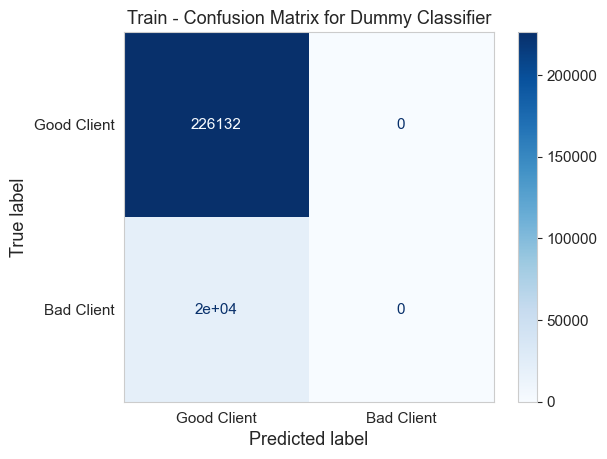

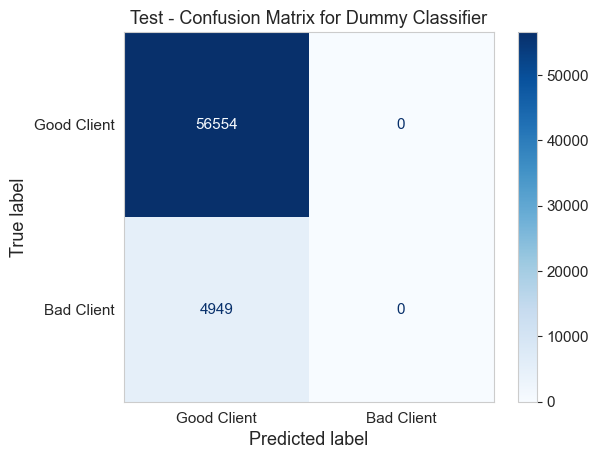

Best Dummy Classifier model saved in MLflow with roc_auc: 0.500
Running Logistic Regression...


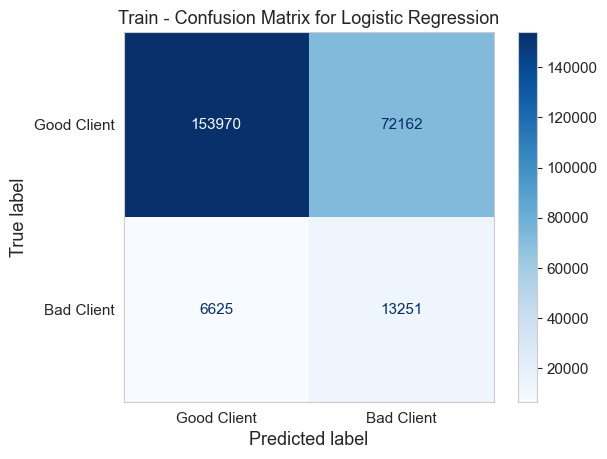

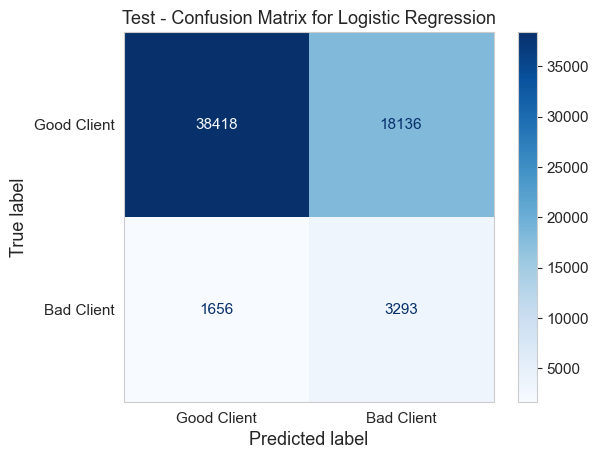

Best Logistic Regression model saved in MLflow with roc_auc: 0.735
Running Lgb Random Forest Classifier...


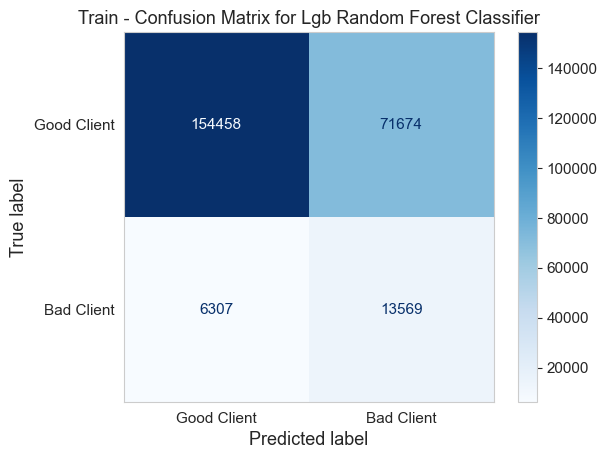

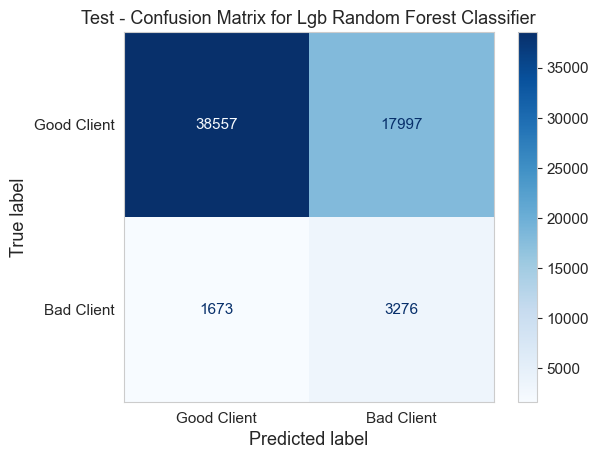

Best Lgb Random Forest Classifier model saved in MLflow with roc_auc: 0.736
Running LightGBM Classifier...


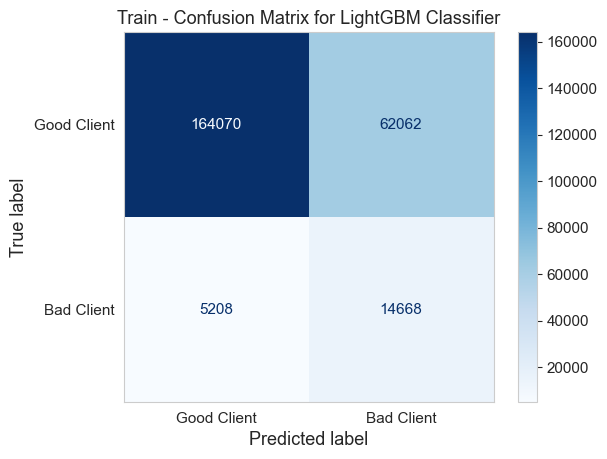

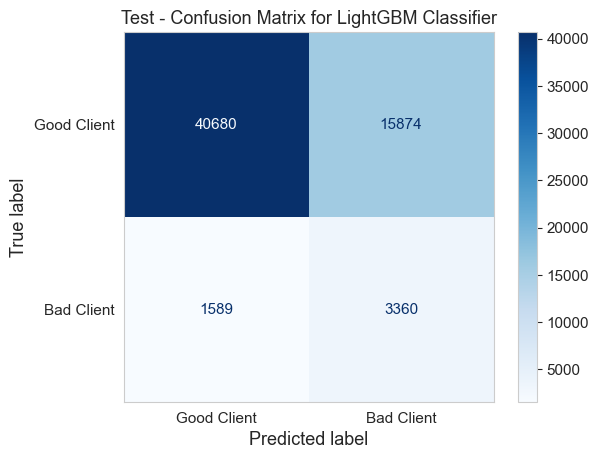

Best LightGBM Classifier model saved in MLflow with roc_auc: 0.765
All models have been tuned and logged in MLflow.


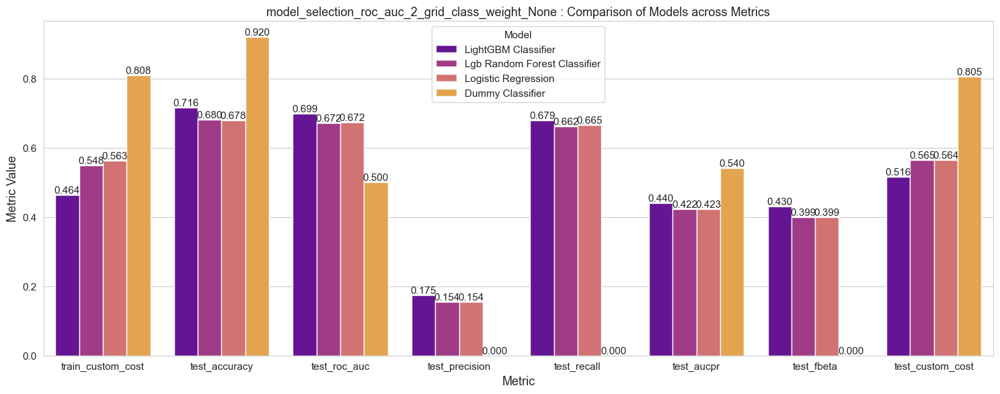

Running with parameters: {'run_type': 'model_selection', 'search_type': 'grid', 'sampling_method': 'class_weight', 'sampling_strategy': None, 'fp_weight': 1, 'fn_weight': 10, 'register': False, 'optim_threshold': False, 'scoring_metric': 'custom_cost', 'beta': 2}
Parent Run: model_selection_custom_cost_2_grid_class_weight_None
Running Dummy Classifier...


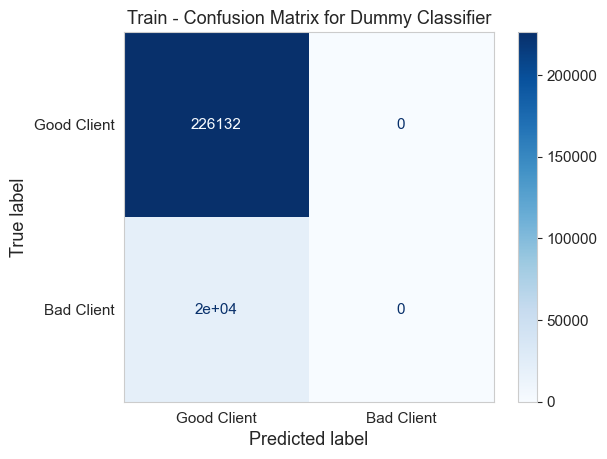

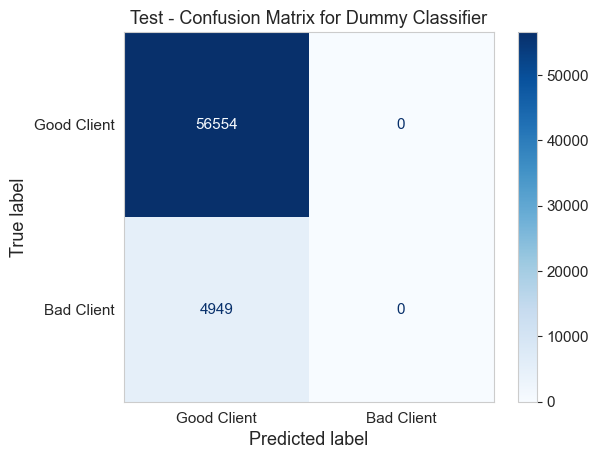

Best Dummy Classifier model saved in MLflow with custom_cost: -0.808
Running Logistic Regression...


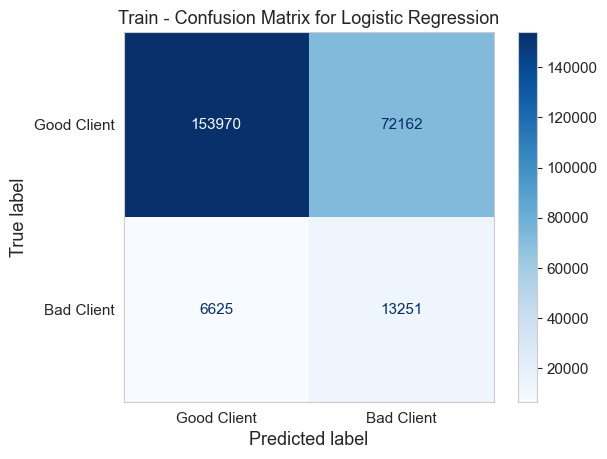

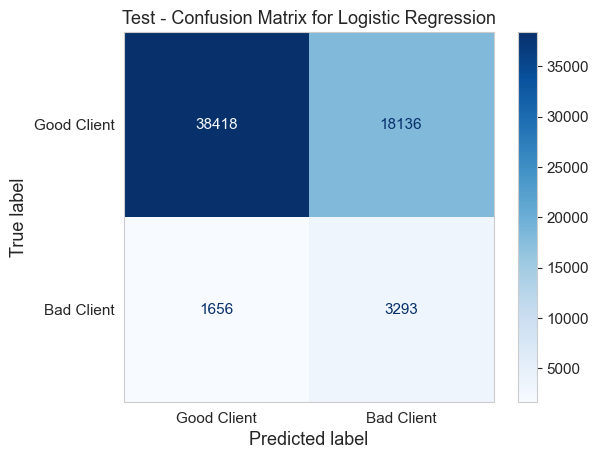

Best Logistic Regression model saved in MLflow with custom_cost: -0.563
Running Lgb Random Forest Classifier...


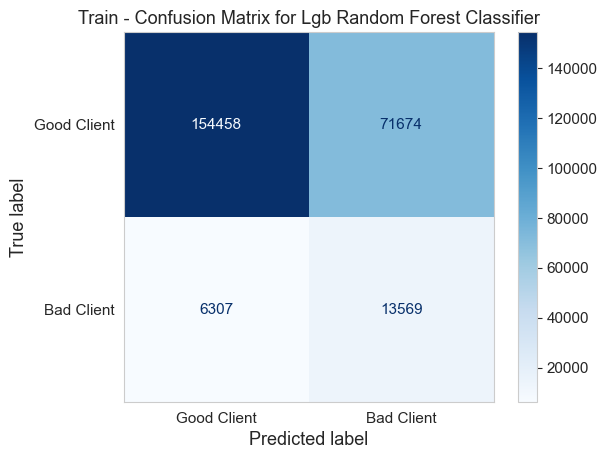

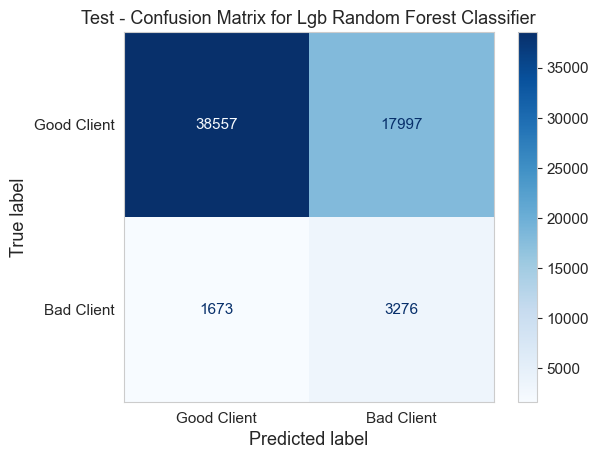

Best Lgb Random Forest Classifier model saved in MLflow with custom_cost: -0.560
Running LightGBM Classifier...


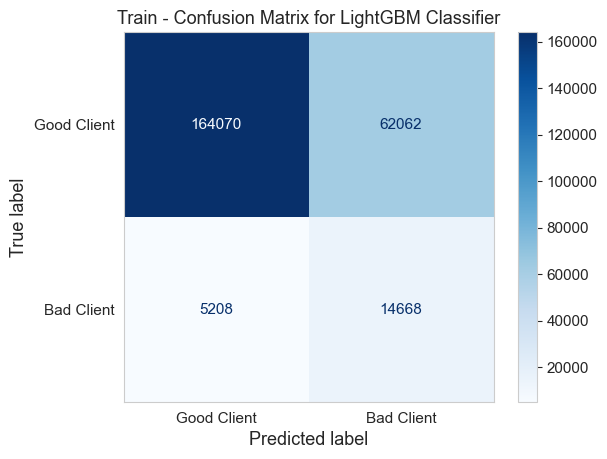

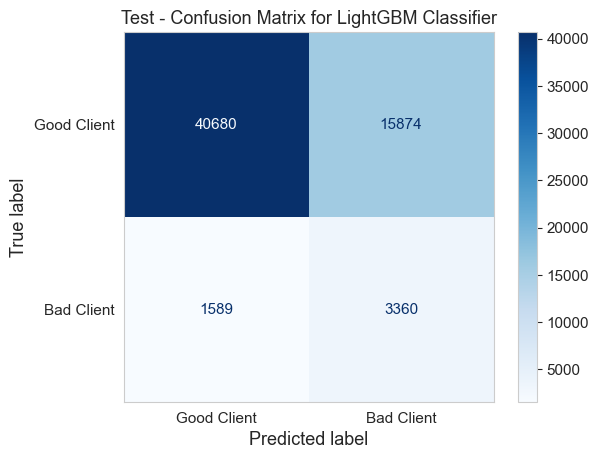

Best LightGBM Classifier model saved in MLflow with custom_cost: -0.521
All models have been tuned and logged in MLflow.


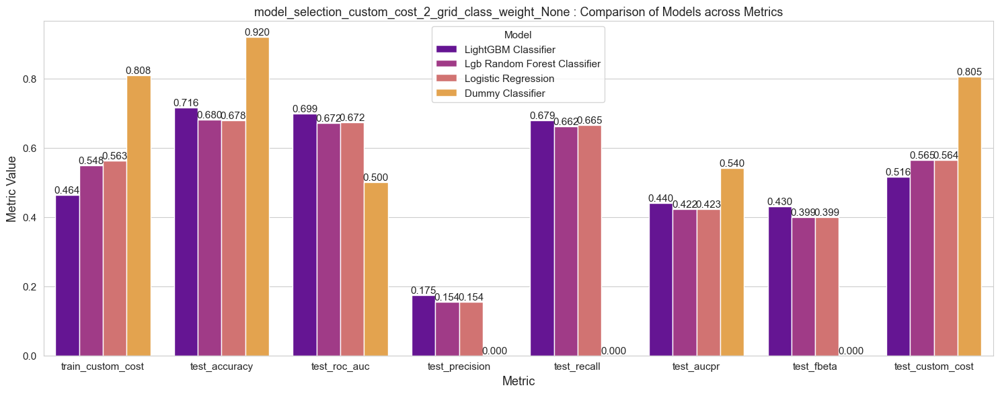

In [26]:
# List of scoring metrics to test
scoring_metrics = [
    {'metric': 'roc_auc', 'beta': 2},  
    {'metric': 'custom_cost', 'beta': 2} 
]

# Base parameters
run_params_base_3 = {
    'run_type': 'model_selection',
    'search_type': 'grid',
    'sampling_method':'class_weight',
    'sampling_strategy' : None,
    'fp_weight': 1,
    'fn_weight': 10,
    'register' : False,
    'optim_threshold' : False
}

# Loop over scoring metrics and update run parameters
for scoring in scoring_metrics:
    run_params = run_params_base_3.copy()  
    run_params['scoring_metric'] = scoring['metric']
    run_params['beta'] = scoring['beta']  
    
    # Print or use run_params for model training
    print("Running with parameters:", run_params)
    func.run_experiment(models, X_train, y_train, X_test, y_test, run_params)
    
    # Plot results
    parent_run_name = f"{run_params['run_type']}_{run_params['scoring_metric']}_{run_params['beta']}_{run_params['search_type']}_{run_params['sampling_method']}_{run_params['sampling_strategy']}"

    func.plot_model_comparisons(experiment_name, parent_run_name)

## Result analysis - find best model

Analyse des performances de l'ensemble des modèles entraînés précédemment pour identifier celui qui est le plus performant en fonction des critères test_custom_cost, test_roc_auc et test_accuracy, en utilisant un classement composite basé sur ces métriques.

In [29]:
# Get Best model
best_model_df = func.compare_runs_across_specified_parent_runs(experiment_name, keyword="model_selection")

parent_run_name = best_model_df['parent_run_name'][0]
model_name = best_model_df['model'][0]

# Get best_params for best_model
best_params = func.get_logged_model_params(experiment_name, parent_run_name, model_name)

# Print classification params
classification_params = [
    {'classification': param['classification'].get_params()} for param in best_params if 'classification' in param
]

print('Best parameters : \n',json.dumps(classification_params, indent=4))

Best model based on composite ranking across test_custom_cost, test_roc_auc, and test_accuracy:


,model_parent,test_custom_cost,test_roc_auc,test_accuracy
0,model_selection_custom_cost_2_grid_class_weight_None_lightgbm_classifier,0.516463,0.699119,0.716063


Best parameters : 
 [
    {
        "classification": {
            "boosting_type": "gbdt",
            "class_weight": "balanced",
            "colsample_bytree": 1.0,
            "importance_type": "split",
            "learning_rate": 0.1,
            "max_depth": -1,
            "min_child_samples": 20,
            "min_child_weight": 0.001,
            "min_split_gain": 0.0,
            "n_estimators": 100,
            "n_jobs": null,
            "num_leaves": 31,
            "objective": "binary",
            "random_state": 42,
            "reg_alpha": 0.0,
            "reg_lambda": 0.0,
            "subsample": 1.0,
            "subsample_for_bin": 200000,
            "subsample_freq": 0
        }
    }
]


# Model optimisation

Optimisation du meilleur modèle sélectionné à l'étape précédente à l'aide d'une méthode de cross-validation. Cette étape permet également d'identifier le seuil optimal (threshold) pour maximiser les performances du modèle.
Le modèle final est ensuite enregistré dans Mlflow Registry.

In [30]:
models = {
    # LightGBM Classifier
    'LightGBM Classifier': (LGBMClassifier(class_weight='balanced',
                                           objective='binary', 
                                           random_state=seed), {
        'classification__n_estimators': [50, 100, 150],
        'classification__learning_rate': [0.001, 0.01, 0.1],
        'classification__max_depth': [-1, 3, 7],
        'classification__num_leaves': [31, 63, 127],
    })
}

Running with parameters: {'run_type': 'model_optimisation', 'search_type': 'grid', 'scoring_metric': 'custom_cost', 'sampling_method': 'class_weight', 'sampling_strategy': None, 'beta': 2, 'fp_weight': 1, 'fn_weight': 10, 'register': True, 'optim_threshold': True}
Parent Run: model_optimisation_custom_cost_2_grid_class_weight_None
Running LightGBM Classifier...
Optimal threshold : 0.50 with custom_cost value: 0.44


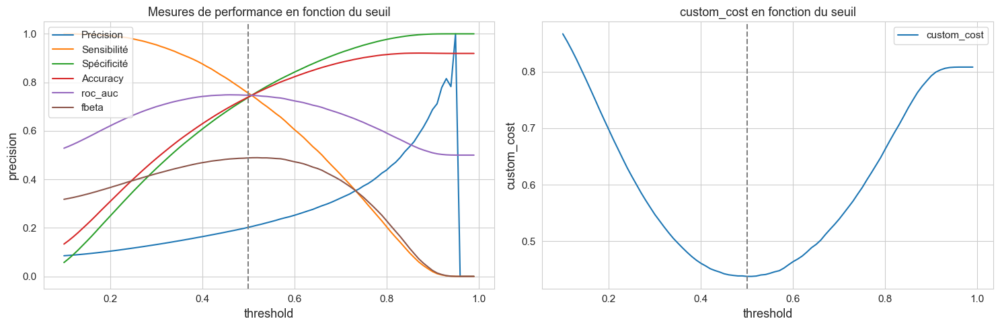

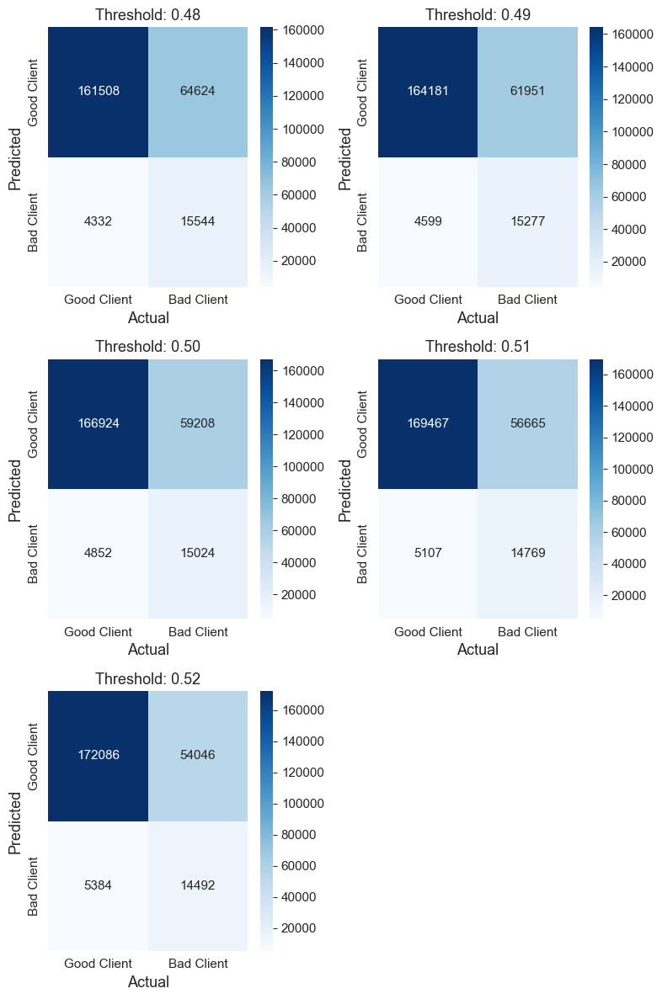

Best custom_cost for threshold = 0.50


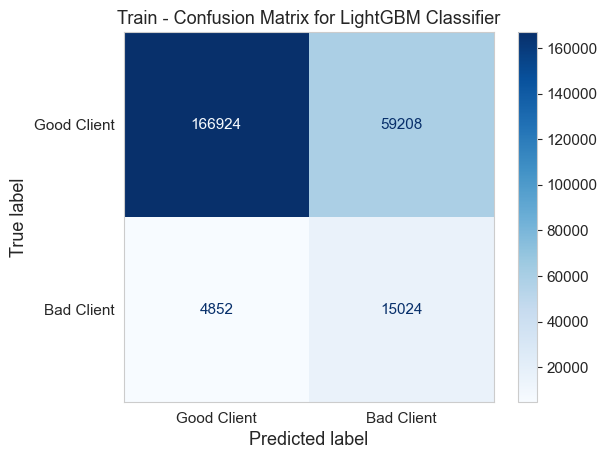

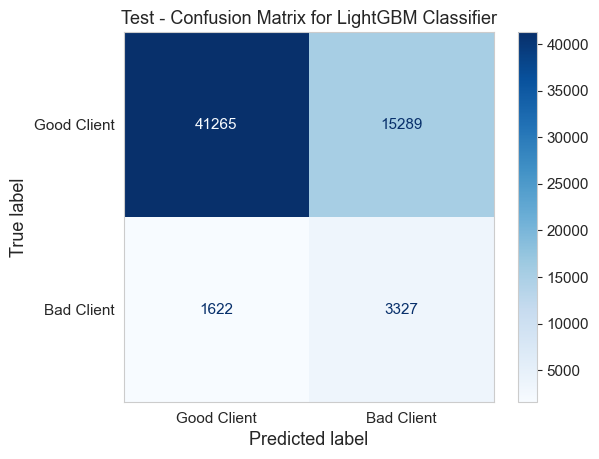

Successfully registered model 'model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier'.
Created version '1' of model 'model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier'.


Model registered as model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier.
Best LightGBM Classifier model saved in MLflow with custom_cost: -0.519
All models have been tuned and logged in MLflow.


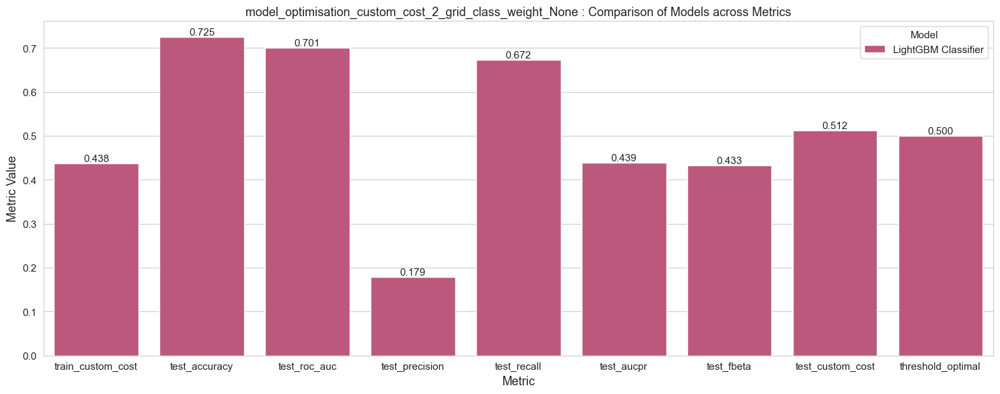

In [33]:
# Parameters
run_params = {
    'run_type': 'model_optimisation',
    'search_type': 'grid',
    'scoring_metric':'custom_cost',
    'sampling_method':'class_weight',
    'sampling_strategy' : None,
    'beta':2,
    'fp_weight': 1,
    'fn_weight': 10,
    'register' : True,
    'optim_threshold' : True
}
 

# Print or use run_params for model training
print("Running with parameters:", run_params)
func.run_experiment(models, X_train, y_train, X_test, y_test, run_params)

# Plot results
parent_run_name = f"{run_params['run_type']}_{run_params['scoring_metric']}_{run_params['beta']}_{run_params['search_type']}_{run_params['sampling_method']}_{run_params['sampling_strategy']}"

func.plot_model_comparisons(experiment_name, parent_run_name)

# Feature importance

Analyse des importances des variables (features) à la fois globalement et localement pour le modèle final: 
* L'analyse globale permet d'identifier quelles sont les caractéristiques les plus influentes pour la prise de décision du modèle sur l'ensemble des données.
* L'analyse locale examine l'impact de chaque caractéristique sur les prédictions spécifiques pour des observations individuelles.

In [10]:
# Final model name
model_name = 'model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier'

In [13]:
# Get pipeline and latest version 
pipeline, version = func.load_model(model_name)
print(f"Latest version of model {model_name} : {version}")

Latest version of model model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier : 1


In [14]:
final_model = pipeline.named_steps['classification']
scaler = pipeline.named_steps['scaling']

In [15]:
# Fit imputer 
imputer = SimpleImputer(strategy='median')
imputer.fit(X_train)

# Impute missing values
X_train_imputed = imputer.transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Scale data
X_train_scaled = scaler.transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

## Feature importance globale

Les variables les plus influentes sur le modèle sont : 
* PAYMENT_RATE :  Taux de remboursement (mensualité par rapport au montant total du crédit)
* EXT_SOURCE_2 : Score normalisé provenant d'une source de données externe
* EXT_SOURCE_3 : Score normalisé provenant d'une source de données externe
* DAYS_EMPLOYED : Nombre de jours avant la demande où la personne a commencé son emploi actuel
* AMT_ANNUITY : Annuité du prêt

### Feature importance global calculated by LightGBM

In [16]:
# Feature importance globale
global_feature_importance = final_model.feature_importances_

In [20]:
feature_names = X_train.columns

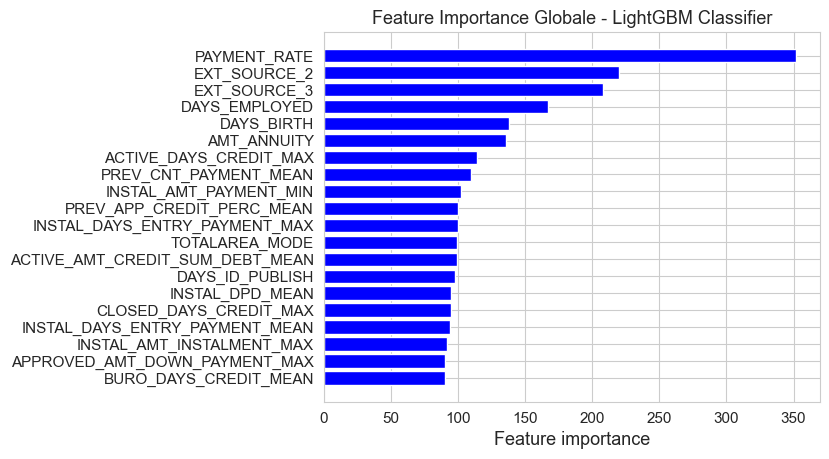

In [18]:
# Affichage du top 20 des features par importance
top_x = 20
indices = np.argsort(global_feature_importance)
indices = indices[-top_x:]

plt.barh(range(len(indices)), global_feature_importance[indices], color='b', align='center') 
plt.title('Feature Importance Globale - LightGBM Classifier')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices]) 
plt.xlabel('Feature importance')
plt.show()

### Feature importance global calculated by SHAP

In [17]:
# Récupération des valeurs de Shapley
explainer = shap.TreeExplainer(final_model)

In [18]:
shap_values = explainer.shap_values(X_test_scaled)

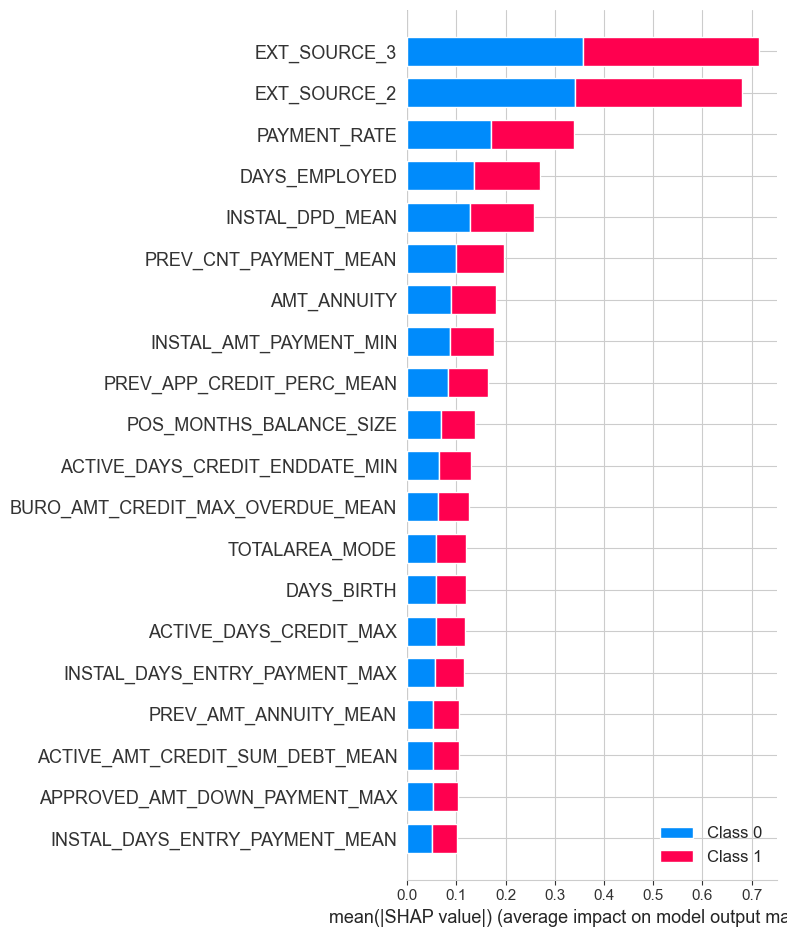

In [21]:
shap.summary_plot(shap_values,
                  features = X_test_scaled,
                  feature_names=feature_names)

## Feature importance locale

In [21]:
shap_values_test = explainer(X_test_scaled)
shap_values_test.feature_names = feature_names

### Good client

In [22]:
# Index of good client
index_good_client = y_test[y_test == 0].index

* **Good client - first example** 

In [24]:
loc_good_1 = X_test.index.get_loc(index_good_client[0])

In [23]:
# Data of good client
display(X_test.iloc[loc_good_1])

EXT_SOURCE_2                                    0.604894
PAYMENT_RATE                                    0.113095
EXT_SOURCE_3                                    0.000527
DAYS_BIRTH                                  13297.000000
DAYS_EMPLOYED                                -762.000000
DAYS_REGISTRATION                            -637.000000
DAYS_ID_PUBLISH                             -4307.000000
ANNUITY_INCOME_PERCENT                          0.254304
INSTAL_DBD_MEAN                                 9.000000
DAYS_LAST_PHONE_CHANGE                         -2.000000
AMT_ANNUITY                                 52641.000000
ACTIVE_DAYS_CREDIT_UPDATE_MEAN               -218.000000
REGION_POPULATION_RELATIVE                      0.009630
INSTAL_DAYS_ENTRY_PAYMENT_MAX               -1627.000000
CLOSED_DAYS_CREDIT_MAX                       -587.000000
ACTIVE_DAYS_CREDIT_ENDDATE_MIN              -2710.000000
INSTAL_AMT_PAYMENT_MIN                          0.045000
PREV_APP_CREDIT_PERC_VAR       

In [25]:
# Force plot
shap.force_plot(explainer.expected_value[0], 
                explainer.shap_values(X_test_scaled[loc_good_1].reshape(1, -1))[0], 
                X_test_scaled[loc_good_1].reshape(1, -1), 
                feature_names=feature_names,
                out_names="")

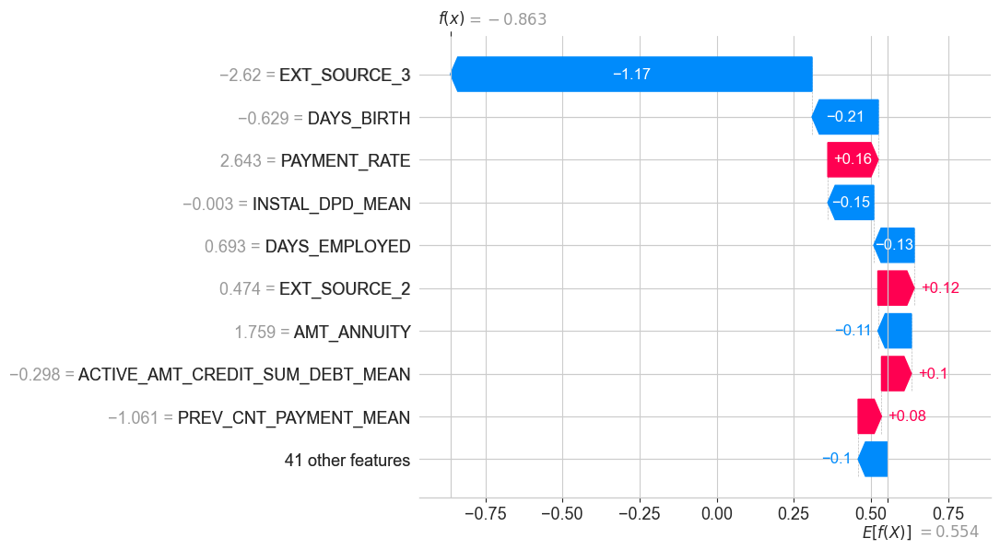

In [26]:
# Waterfall plot
shap.plots.waterfall(shap_values_test[loc_good_1][..., 0])

* **Good client - second example** 

In [28]:
loc_good_2 = X_test.index.get_loc(index_good_client[10])

In [27]:
# Data of good client
display(X_test.iloc[loc_good_2])

EXT_SOURCE_2                               5.746639e-01
PAYMENT_RATE                               2.887388e-02
EXT_SOURCE_3                               1.808880e-01
DAYS_BIRTH                                 2.253200e+04
DAYS_EMPLOYED                                       NaN
DAYS_REGISTRATION                         -1.023100e+04
DAYS_ID_PUBLISH                           -4.226000e+03
ANNUITY_INCOME_PERCENT                     6.341667e-02
INSTAL_DBD_MEAN                            5.029703e+00
DAYS_LAST_PHONE_CHANGE                    -1.102000e+03
AMT_ANNUITY                                1.712250e+04
ACTIVE_DAYS_CREDIT_UPDATE_MEAN            -3.187500e+01
REGION_POPULATION_RELATIVE                 5.144000e-03
INSTAL_DAYS_ENTRY_PAYMENT_MAX             -2.300000e+01
CLOSED_DAYS_CREDIT_MAX                    -5.710000e+02
ACTIVE_DAYS_CREDIT_ENDDATE_MIN            -1.650000e+03
INSTAL_AMT_PAYMENT_MIN                     1.269000e+01
PREV_APP_CREDIT_PERC_VAR                   2.155

In [29]:
# Force plot
shap.force_plot(explainer.expected_value[0], 
                explainer.shap_values(X_test_scaled[loc_good_2].reshape(1, -1))[0], 
                X_test_scaled[loc_good_2].reshape(1, -1), 
                feature_names=feature_names,
                out_names="")

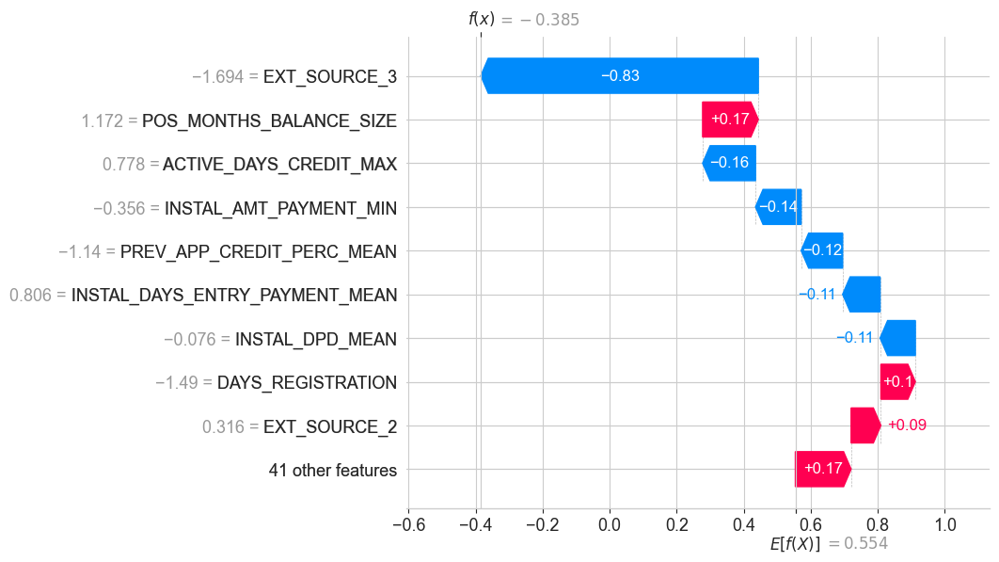

In [30]:
# Waterfall plot
shap.plots.waterfall(shap_values_test[loc_good_2][..., 0])

### Bad client

In [34]:
# Index of bad clients
index_bad_client = y_test[y_test == 1].index

* **Bad client - first example**

In [40]:
loc_bad_1 = X_test.index.get_loc(index_bad_client[0])

In [42]:
# Data of bad client
X_test.iloc[loc_bad_1]

EXT_SOURCE_2                               4.127344e-01
PAYMENT_RATE                               5.145065e-02
EXT_SOURCE_3                               6.397076e-01
DAYS_BIRTH                                 1.328000e+04
DAYS_EMPLOYED                             -2.800000e+02
DAYS_REGISTRATION                         -3.471000e+03
DAYS_ID_PUBLISH                           -4.880000e+03
ANNUITY_INCOME_PERCENT                     2.530000e-01
INSTAL_DBD_MEAN                            1.287500e+01
DAYS_LAST_PHONE_CHANGE                    -9.560000e+02
AMT_ANNUITY                                1.707750e+04
ACTIVE_DAYS_CREDIT_UPDATE_MEAN            -9.270000e+02
REGION_POPULATION_RELATIVE                 6.305000e-03
INSTAL_DAYS_ENTRY_PAYMENT_MAX             -6.140000e+02
CLOSED_DAYS_CREDIT_MAX                    -7.750000e+02
ACTIVE_DAYS_CREDIT_ENDDATE_MIN            -9.570000e+02
INSTAL_AMT_PAYMENT_MIN                     1.381252e+04
PREV_APP_CREDIT_PERC_VAR                   3.041

In [45]:
# force plot
shap.force_plot(explainer.expected_value[0], 
                explainer.shap_values(X_test_scaled[loc_bad_1].reshape(1, -1))[0], 
                X_test_scaled[loc_bad_1].reshape(1, -1), 
                feature_names=feature_names,
                out_names="")

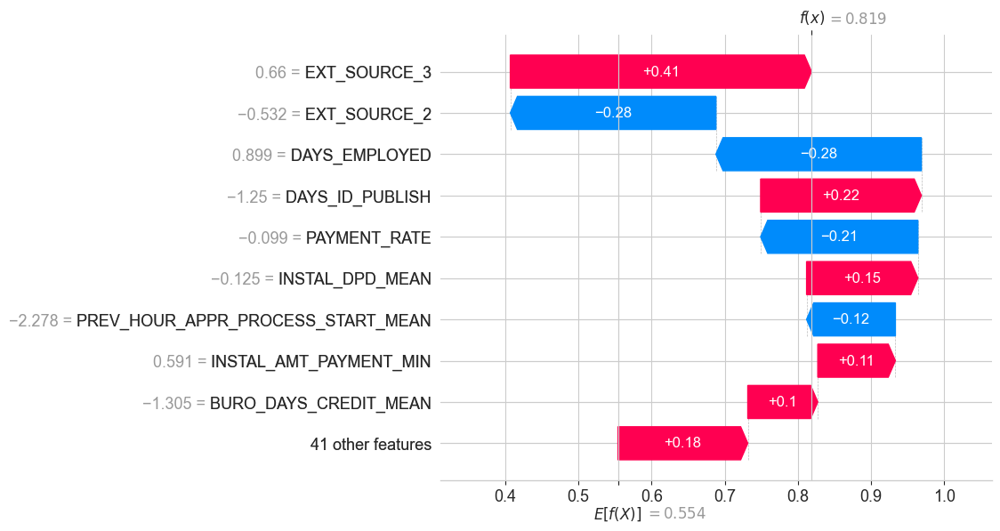

In [46]:
# Waterfall plot
shap.plots.waterfall(shap_values_test[loc_bad_1][..., 0])

* **Bad client - second example**

In [47]:
loc_bad_2 = X_test.index.get_loc(index_bad_client[10])

In [48]:
# Data of good client
display(X_test.iloc[loc_bad_2])

EXT_SOURCE_2                                   0.653459
PAYMENT_RATE                                   0.030513
EXT_SOURCE_3                                   0.368969
DAYS_BIRTH                                 22596.000000
DAYS_EMPLOYED                                       NaN
DAYS_REGISTRATION                            -47.000000
DAYS_ID_PUBLISH                            -4015.000000
ANNUITY_INCOME_PERCENT                         0.269235
INSTAL_DBD_MEAN                                     NaN
DAYS_LAST_PHONE_CHANGE                        -3.000000
AMT_ANNUITY                                20596.500000
ACTIVE_DAYS_CREDIT_UPDATE_MEAN                      NaN
REGION_POPULATION_RELATIVE                     0.028663
INSTAL_DAYS_ENTRY_PAYMENT_MAX                       NaN
CLOSED_DAYS_CREDIT_MAX                     -1607.000000
ACTIVE_DAYS_CREDIT_ENDDATE_MIN                      NaN
INSTAL_AMT_PAYMENT_MIN                              NaN
PREV_APP_CREDIT_PERC_VAR                        

In [49]:
# Force plot
shap.force_plot(explainer.expected_value[0], 
                explainer.shap_values(X_test_scaled[loc_bad_2].reshape(1, -1))[0], 
                X_test_scaled[loc_bad_2].reshape(1, -1), 
                feature_names=feature_names,
                out_names="")

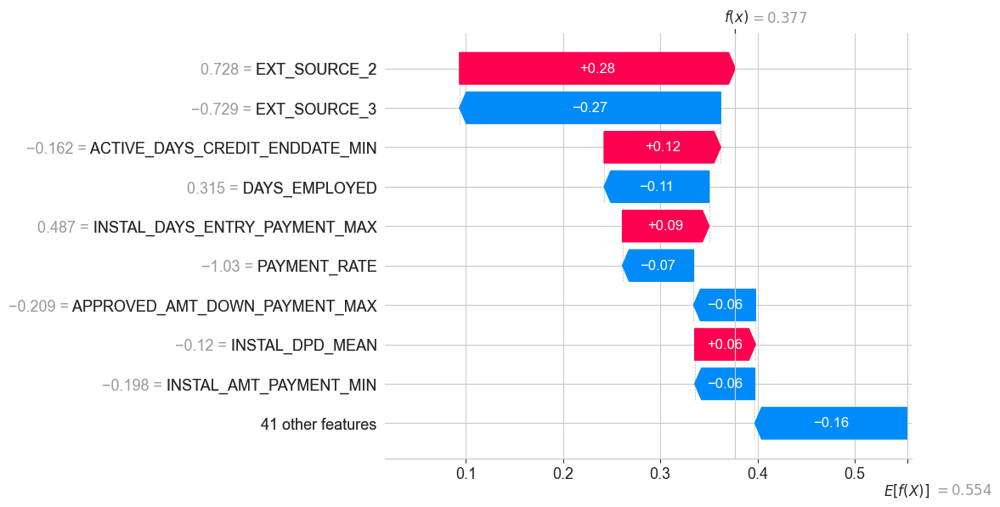

In [50]:
# Waterfall plot
shap.plots.waterfall(shap_values_test[loc_bad_2][..., 0])

# Data drift study

Sur les 50 colonnes analysées, seules 4 présentent un changement significatif dans leur distribution entre les données d'entraînement) et les données de test : le data drift n'est pas généralisé à l'ensemble des features.

2 features sur les 4, AMT_ANNUITY et PAYMENT_RATE, sont des features qui ont une influence importante sur la prise de décision du modèle. La performance du modèle doit être surveillée si elle diminue, un re-entraînement sera nécessaire.

In [51]:
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

In [52]:
# Create report
data_drift_report = Report(metrics=[DataDriftPreset()])

In [53]:
# Define reference data and current data
data_reference = train_df.drop(columns='TARGET')
data_current = test_df.drop(columns='TARGET')

In [54]:
# Calculate data drift between reference data and current data
data_drift_report.run(reference_data=data_reference, current_data=data_current)

In [55]:
# Show report
data_drift_report.show()

In [22]:
# Save repor in HTML
data_drift_report.save_html("data_drift_report.html")

# Save

In [31]:
# Initialize the MLflow client
client = mlflow.tracking.MlflowClient()

In [ ]:
parent_run_name = "model_optimisation_custom_cost_2_grid_class_weight_None"
run_name = 'LightGBM Classifier'

## Transition model version to production

In [37]:
# Get latest version of model
latest_version_info = client.get_latest_versions(model_name)[-1]
latest_version = latest_version_info.version

# Transition the model version to Production
client.set_registered_model_alias(
    name=model_name,
    alias="champion",
    version=latest_version
)

print(f"Model '{model_name}' version {latest_version} has been assigned the alias 'champion' for production.")

Model 'model_optimisation_custom_cost_2_grid_class_weight_None_lightgbm_classifier' version 1 has been assigned the alias 'champion' for production.


## Load last model and get optimal threshold

In [ ]:
# Load the champion model from MLflow Model Registry
model_uri = f"models:/{model_name}@champion"
model_pipeline = mlflow.sklearn.load_model(model_uri)

In [35]:
# Get optimal threshold
metric_dict = {}
metric_dict['threshold'] = func.get_threshold(experiment_name, parent_run_name, run_name)

## Save model and threshold

In [47]:
# Construct the relative path to the app/ directory
app_folder_path = os.path.join("..", "app")
model_file_path = os.path.join(app_folder_path, "best_model_pipeline.joblib")
metric_file_path = os.path.join(app_folder_path, "metric_dict.pkl")

# Save the model pipeline to a joblib file
joblib.dump(model_pipeline, model_file_path)

# Save the metric dictionary to a pickle file
with open(metric_file_path, 'wb') as f:
    pickle.dump(metric_dict, f)

## Save subset with positive and negative cases

In [35]:
# Split the data into train and test sets
train, test = train_test_split(train_df, test_size=0.2, random_state=seed)

# Drop na from test
test_filtered = test.dropna()

# Select one positive case and one negative case for api test
positive_case = test_filtered[test_filtered["TARGET"] == 0].iloc[0]
negative_case = test_filtered[test_filtered["TARGET"] == 1].iloc[0]

# Save in a csv file 
df_subset = pd.DataFrame([positive_case, negative_case])
df_subset = df_subset.drop(columns="TARGET")
save_path = os.path.join(os.path.dirname(os.getcwd()), "tests\\test_cases.csv" )
df_subset.to_csv(save_path, index=False)